This is a notebook used to process and plot data from Del Vecchio et al "Hillslope-channel coupling in a changing permafrost landscape: the critical role of water tracks "

# Import packages

In [73]:
import os
from osgeo import gdal, ogr, osr
import rasterio
from rasterio.plot import show
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import matplotlib.colors as colors
from scipy.stats import binned_statistic



import shapely.geometry

import seaborn as sns

import rioxarray as rxr
import xarray
import pandas as pd

from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from matplotlib import colors
from matplotlib import ticker, cm

from rasterstats import zonal_stats

# from statannotations.Annotator import Annotator

%matplotlib inline
import matplotlib
matplotlib.rcParams.update({"pdf.fonttype":42})

In [74]:
sample_stack = False
# If true, do the intensive stack sampling
polygonize_raster = False
# If true, do the also intensive polygonizing raster data
load_data = True
# If true, just load in the final data

In [75]:
basic_stack_dir = "./basic_stack_dir/"

# Clean InSAR data

In [78]:
# https://zenodo.org/record/7542485#.Y9KVWXbMKUk

# It is expectionally easier to clip a raster to boundaries than it is to burn in nodatas with polygons so this is where we are

area = gpd.read_file("expanded_insar_clipper.shp")

questionable = gpd.read_file("./zwieback/1519_questionable.gpkg")
questionable.to_crs("EPSG:4326").to_file("./zwieback/1519_questionable.shp") #shapefiles from zotero are UTM

questionable = gpd.read_file("./zwieback/1517_questionable.gpkg")
questionable.to_crs("EPSG:4326").to_file("./zwieback/1517_questionable.shp")

In [79]:
from rasterio.mask import mask
from rasterio.warp import calculate_default_transform, reproject, Resampling
shapefile = gpd.read_file("./zwieback/1519_questionable.shp")

dst_crs='EPSG:32603'

with rasterio.open('./zwieback/1519_fitted_velocity.tif') as src:
    out, _ = mask(src, shapefile.geometry, nodata=np.nan, invert=True)
    # out_meta = src.meta
    # out_meta.update({"driver": "GTiff", "compression": "LWZ"})
    transform, width, height = calculate_default_transform(
        src.crs, dst_crs, src.width, src.height, *src.bounds)
    kwargs = src.meta.copy()
    kwargs.update({
        'crs': dst_crs,
        'transform': transform,
        'width': width,
        'height': height,
        'count':1 #turn off when you figure out whch band to use
    })
    with rasterio.open('./basic_stack_dir/1519_masked.tif', 'w', **kwargs) as dst:   
# This should be range(2) since it's a 2 band raster but idk which band is the right one 
         for i in range(1):
            reproject(
                    # source=out[i],
                    # destination=rasterio.band(dst, i+1),
                    source=out[0],
                    destination=rasterio.band(dst, 1),
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=transform,
                    dst_crs=dst_crs,
                    resampling=Resampling.bilinear)
    

In [80]:
import fiona
import rasterio
from rasterio.mask import mask
from rasterio.warp import calculate_default_transform, reproject, Resampling
shapefile = gpd.read_file("./zwieback/1517_questionable.shp")

with rasterio.open('./zwieback/1517_fitted_velocity.tif') as src:
    out, _ = mask(src, shapefile.geometry, nodata=np.nan, invert=True)
    # out_meta = src.meta
    # out_meta.update({"driver": "GTiff", "compression": "LWZ"})
    transform, width, height = calculate_default_transform(
        src.crs, 'EPSG:32603', src.width, src.height, *src.bounds)
    kwargs = src.meta.copy()
    kwargs.update({
        'crs': 'EPSG:32603',
        'transform': transform,
        'width': width,
        'height': height,
        'count':1 #turn off when you figure out whch band to use
    })
    with rasterio.open('./basic_stack_dir/1517_masked.tif', 'w', **kwargs) as dst:   
        # This should be range(2) since it's a 2 band raster but idk which band is the right one 
        for i in range(1):
            reproject(
                    # source=out[i],
                    # destination=rasterio.band(dst, i+1),
                    source=out[0],
                    destination=rasterio.band(dst, 1),
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=transform,
                    dst_crs='EPSG:32603',
                    resampling=Resampling.bilinear)

In [81]:
with rasterio.open('./zwieback/1517_fitted_velocity.tif') as src:
    transform, width, height = calculate_default_transform(
        src.crs, 'EPSG:32603', src.width, src.height, *src.bounds)
    kwargs = src.meta.copy()
    kwargs.update({
        'crs': 'EPSG:32603',
        'transform': transform,
        'width': width,
        'height': height,
        'count':1 #turn off when you figure out whch band to use
    })
    with rasterio.open('./basic_stack_dir/1517_all.tif', 'w', **kwargs) as dst:   
         for i in range(1):
            reproject(
                    # source=src.read(i+1),
                    # destination=rasterio.band(dst, i+1),
                    source=src.read(1),
                    destination=rasterio.band(dst, 1),
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=transform,
                    dst_crs='EPSG:32603',
                    resampling=Resampling.bilinear)
            
with rasterio.open('./zwieback/1519_fitted_velocity.tif') as src:
    transform, width, height = calculate_default_transform(
        src.crs, 'EPSG:32603', src.width, src.height, *src.bounds)
    kwargs = src.meta.copy()
    kwargs.update({
        'crs': 'EPSG:32603',
        'transform': transform,
        'width': width,
        'height': height,
        'count':1 #turn off when you figure out whch band to use
    })
    with rasterio.open('./basic_stack_dir/1519_all.tif', 'w', **kwargs) as dst:   
         for i in range(1):
            reproject(
                    # source=src.read(i+1),
                    # destination=rasterio.band(dst, i+1),
                    source=src.read(1),
                    destination=rasterio.band(dst, 1),
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=transform,
                    dst_crs='EPSG:32603',
                    resampling=Resampling.bilinear)

# Create rasters for the "stack" with downscaled DEM (run once)

## Resample ArcticDEM

The 2 m resolution was important when we ran LSDTT, but we're going to coarsen it to eliminate microtopography

In [82]:
elev_raster_path = "./basic_stack_dir/seward2_hsp_elev.tif"

from contextlib import contextmanager  

import rasterio
from rasterio import Affine, MemoryFile
from rasterio.enums import Resampling

# use context manager so DatasetReader and MemoryFile get cleaned up automatically
@contextmanager
def resample_raster(raster, target_res=15):
    t = raster.transform

    # rescale the metadata
    scale = t[0]/target_res
    transform = Affine(t.a / scale, t.b, t.c, t.d, t.e / scale, t.f)
    height = int(raster.height * scale)
    width = int(raster.width * scale)

    profile = raster.profile
    profile.update(transform=transform, driver='GTiff', height=height, width=width)

    data = raster.read( # Note changed order of indexes, arrays are band, row, col order not row, col, band
            out_shape=(raster.count, height, width),
            resampling=Resampling.cubic,
        )

    with MemoryFile() as memfile:
        with memfile.open(**profile) as dataset: # Open as DatasetWriter
            dataset.write(data)                     
            del data

        with memfile.open() as dataset:  # Reopen as DatasetReader
            yield dataset  # Note yield not return     


with rasterio.open(elev_raster_path) as src:
    with resample_raster(src) as resampled:
        print('Orig dims: {}, New dims: {}'.format(src.shape, resampled.shape))
        print(repr(resampled))
        out_meta = resampled.meta.copy()
        with rasterio.open(("15m_dem.tif"),"w",**out_meta) as dest:
            dest.write(resampled.read(1),1)
       

        
        
#https://gis.stackexchange.com/questions/329434/creating-an-in-memory-rasterio-dataset-from-numpy-array/329439#329439
#with edits by me to turn height and width to integer if you want to downscale
#and automated scaling after providing desired output resolution (a little more intuitive)

Orig dims: (11414, 12127), New dims: (1521, 1616)
<open DatasetReader name='/vsimem/6221bd74-8623-4d2d-85fb-c19f0c2df455/6221bd74-8623-4d2d-85fb-c19f0c2df455.tif' mode='r'>


In [83]:
# def resample_raster(raster, target_res=40):
#     t = raster.transform

#     # rescale the metadata
#     scale = t[0]/target_res
#     transform = Affine(t.a / scale, t.b, t.c, t.d, t.e / scale, t.f)
#     height = int(raster.height * scale)
#     width = int(raster.width * scale)

#     profile = raster.profile
#     profile.update(transform=transform, driver='GTiff', height=height, width=width)

#     data = raster.read( # Note changed order of indexes, arrays are band, row, col order not row, col, band
#             out_shape=(raster.count, height, width),
#             resampling=Resampling.cubic,
#         )

#     with MemoryFile() as memfile:
#         with memfile.open(**profile) as dataset: # Open as DatasetWriter
#             dataset.write(data)                     
#             del data

#         with memfile.open() as dataset:  # Reopen as DatasetReader
#             yield dataset  # Note yield not return     


# with rasterio.open(elev_raster_path) as src:
#     with resample_raster(src) as resampled:
#         print('Orig dims: {}, New dims: {}'.format(src.shape, resampled.shape))
#         print(repr(resampled))
#         out_meta = resampled.meta.copy()
#         with rasterio.open(("40m_dem.tif"),"w",**out_meta) as dest:
#             dest.write(resampled.read(1),1)
       

        
        
#https://gis.stackexchange.com/questions/329434/creating-an-in-memory-rasterio-dataset-from-numpy-array/329439#329439
#with edits by me to turn height and width to integer if you want to downscale
#and automated scaling after providing desired output resolution (a little more intuitive)

## Use RichDEM to calculate slope and aspect and send to stack directory

In [84]:
import richdem as rd

new_raster_path = "./15m_dem.tif"

elev  = rd.LoadGDAL(new_raster_path)
slope = rd.TerrainAttribute(elev, attrib='slope_riserun')
aspect = rd.TerrainAttribute(elev, attrib='aspect')

with rasterio.open((os.path.join(basic_stack_dir, "slope_15m.tif")),"w",**out_meta) as dest:
    dest.write(slope, 1) #https://gis.stackexchange.com/questions/279953/numpy-array-to-gtiff-using-rasterio-without-source-raster
with rasterio.open((os.path.join(basic_stack_dir, "aspect_15m.tif")),"w",**out_meta) as dest:
    dest.write(aspect, 1)



A Slope calculation (rise/run)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.0564715====================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.118745======================= ] (99% - 0.0s - 1 threads)


I really need to resample aspect to be 40 m *and* align grid cells with the InSAR raster like in GDAL but this will do the job for now (or get Simon to send his apsect raster, which I think he has)

In [85]:
new_raster_path = "./40m_dem.tif"

elev  = rd.LoadGDAL(new_raster_path)
slope = rd.TerrainAttribute(elev, attrib='slope_riserun')
aspect = rd.TerrainAttribute(elev, attrib='aspect')

with rasterio.open((os.path.join(basic_stack_dir, "slope_40m.tif")),"w",**out_meta) as dest:
    dest.write(slope, 1) #https://gis.stackexchange.com/questions/279953/numpy-array-to-gtiff-using-rasterio-without-source-raster
with rasterio.open((os.path.join(basic_stack_dir, "aspect_40m.tif")),"w",**out_meta) as dest:
    dest.write(aspect, 1)


A Slope calculation (rise/run)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.00956365===================== ] (99% - 0.0s - 1 threads)

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.0181929====================== ] (99% - 0.0s - 1 threads)


# Sample hillslope transects along the raster stack

I'll admit: I traced these transects in ArcMaP,

but this profile is superior to Arcs!

In [86]:
def extract_along_line(xarr, xarr_string, line, crs, resolution):
    x=[]
    y=[]
    profile = []
    
    line_length = line.length
    n_samples= int(round(line_length/resolution))

    for i in range(n_samples):
        # get next point on the line
        point = line.interpolate(i / n_samples - 1., normalized=True)
        # access the nearest pixel in the xarray
        value = xarr.sel(x=point.x, y=point.y, method="nearest").data
        
        x.append(point.x)
        y.append(point.y)
        profile.append(value)
        
    df = pd.DataFrame({'x':x, 'y':y, xarr_string : np.asarray(profile)})
    
    gdf = gpd.GeoDataFrame(
        df,
        geometry=gpd.points_from_xy(df.x, df.y),
        crs=crs
                          )
    
    gdf['distance_between'] = gdf.distance(gdf.shift(1))
    gdf['distance'] = gdf['distance_between'].cumsum()
    return gdf

# based on https://stackoverflow.com/questions/62283718/how-to-extract-a-profile-of-value-from-a-raster-along-a-given-line

In [87]:
profiles = gpd.read_file('hillslope_transects.shp')

In [88]:
profiles['Name'] = profiles.index.values.astype(str)

In [89]:
elev_raster_path = "./basic_stack_dir/seward2_hsp_elev.tif"
insar_raster_path = "./basic_stack_dir/1517_all.tif"
curv_raster_path = "./basic_stack_dir/seward_hsp__tan_curv_LW.tif"

# Load xarray
elevation = rxr.open_rasterio(elev_raster_path).squeeze()
insar = rxr.open_rasterio(insar_raster_path).squeeze()
curv = rxr.open_rasterio(curv_raster_path).squeeze()

#line = profiles_interp

extracted_elev = {}
extracted_insar = {}
extracted_curv = {}


for i in profiles.index:
    extracted_elev[i]= extract_along_line(elevation, 'elevation', profiles.loc[i, 'geometry'], crs=profiles.crs, resolution=2)
    extracted_insar[i]= extract_along_line(insar, 'insar', profiles.loc[i, 'geometry'], crs=profiles.crs, resolution=2).rolling(20).mean()
    extracted_curv[i]= extract_along_line(curv, 'curv', profiles.loc[i, 'geometry'], crs=profiles.crs, resolution=2).rolling(20).mean()


/dartfs-hpc/rc/home/1/f005dv1/.conda/envs/seward/lib/python3.10/site-packages/geopandas/array.py:1406: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 3N (the single non-null crs provided).
  warnings.warn(
/dartfs-hpc/rc/home/1/f005dv1/.conda/envs/seward/lib/python3.10/site-packages/geopandas/array.py:1406: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 / UTM zone 3N (the single non-null crs provided).
  warnings.warn(
/scratch/ipykernel_87592/3224539259.py:19: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['geometry'], dtype='object')
  extracted_insar[i]= extract_along_line(insar, 'insar', profiles.loc[i, 'geometry'], crs=profiles.crs, resolution=2).rolling(20).mean()
/dartfs-hpc/rc/home/1/f005dv1/.conda/envs/seward/li

To do: add code that loops through stack like landscape-wide code

In [90]:
elev_df = pd.concat(extracted_elev, axis=0).reset_index(level=0).rename({'level_0':'profile'}, axis=1).reset_index()
insar_df = pd.concat(extracted_insar, axis=0).reset_index(level=0).rename({'level_0':'profile'}, axis=1).reset_index()
curv_df = pd.concat(extracted_curv, axis=0).reset_index(level=0).rename({'level_0':'profile'}, axis=1).reset_index()
multiprofile_df = elev_df.join(insar_df['insar']).join(curv_df['curv'])

# # Reduce noise with a rolling mean
# multiprofile_df['insar_rolling'] = multiprofile_df['insar'].rolling(20).mean()
# multiprofile_df['curv_rolling'] = multiprofile_df['curv'].rolling(20).mean()

/scratch/ipykernel_87592/2579564777.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


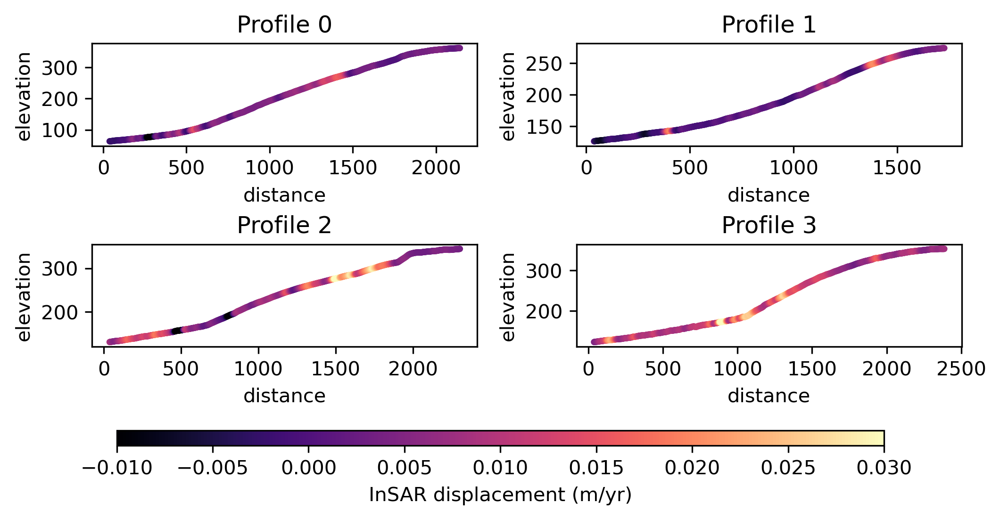

In [91]:
fig, axes = plt.subplots(2,2, figsize=(7,4), dpi=300)
# for (profile, group), ax in zip(multiprofile_df.groupby('profile'), axes.flatten()):
for (profile, group), ax in zip(multiprofile_df.groupby('profile'), axes.flat):
        profile_name = 'Profile '+str(profile)
        # group.plot(x='distance', y='curv', kind='line', c='b', alpha=0.5, legend=False,
        #     # c='insar', cmap='magma', vmax=0.03, vmin=-0.01,
        #     ax=ax, title=str(profile_name))
        # ax.set_ylabel("Curvature", color='b')
        # ax.tick_params(axis='y', colors='b')
        # ax2 = ax.twinx()
        im = group.plot(x='distance', y='elevation', kind='scatter', s=5,
               c='insar', cmap='magma', vmax=0.03, vmin=-0.01,
               colorbar=False,
              #  ax=ax2,
               ax=ax,
               title=str(profile_name))
        # cb = fig.colorbar(im) 
        # cb.remove() 

norm = plt.Normalize(vmax=0.03, vmin=-0.01)
sm = plt.cm.ScalarMappable(cmap="magma", norm=norm)

cbar = fig.colorbar(sm,
  ax=axes.ravel().tolist(),
   orientation='horizontal',
   pad=-0.45,
   aspect=50,
   )
cbar.set_label("InSAR displacement (m/yr)")

fig.tight_layout()

# plt.savefig(('./figure_outputs/hillslope_transects.png'), bbox_inches="tight")
plt.savefig(('./figure_outputs/hillslope_transects.pdf'), bbox_inches="tight")


# https://stackoverflow.com/questions/33150510/how-to-create-groupby-subplots-in-pandas

# Get slope area info on manually-delineated channel heads

In [92]:
%%capture
#rasterstats throwing error every iteration 
manual_heads = gpd.read_file('manual_heads.shp')

# create "coverage" buffers
manual_heads_buffer = manual_heads[['geometry']].copy()
# take care here - your data should be in a projected CRS
# if you want to interpret this as a distance in meters
manual_heads_buffer['geometry'] = manual_heads_buffer.buffer(50.0) 


with rasterio.open("./basic_stack_dir/slope_15m.tif") as src:
    affine = src.transform
    array = src.read(1)
    df_zonal_stats = pd.DataFrame(zonal_stats(manual_heads_buffer, array, affine=affine))

# adding statistics back to original GeoDataFrame
gdf2 = pd.concat([manual_heads, df_zonal_stats.add_prefix('slope_')], axis=1) 

with rasterio.open("./basic_stack_dir/seward_hsp__dinf_area.tif") as src:
    affine = src.transform
    array = src.read(1)
    df_zonal_stats = pd.DataFrame(zonal_stats(manual_heads_buffer, array, affine=affine))

# adding statistics back to original GeoDataFrame
manual_heads_stats = pd.concat([gdf2, df_zonal_stats.add_prefix('dinf_')], axis=1) 

In [93]:
# Del Vecchio et al., 2023? ESurf

t47_failures = pd.read_csv('Teller_47_failure_polygon_stats.csv')

t47_failures['slope_mean_rad'] = np.tan(np.deg2rad(t47_failures['slope_mean']))

In [94]:
def make_heatmap_from_df(df_stats, pts):
    
    # Make heatmap
    # pts is number of spacings in the bins in slope-area space
    slope_array=np.linspace(np.deg2rad(7),np.deg2rad(25),num=pts)
    # da_array=np.geomspace(1e1,1e4,num=pts)
    da_array=[1e1, 5e1, 1e2, 5e2, 1e3, 5e3, 1e4]

    df_stats['bin_dinf'] = pd.cut(df_stats['dInf_max'],bins=da_array, labels=range(len(da_array)-1)
                                 )
    df_stats['bin_slope'] = pd.cut(df_stats['slope_mean_rad'],bins=slope_array, labels=range(len(slope_array)-1))
                                   
    heatmap_df = df_stats
                                  
    df_out = df_stats.groupby(['bin_slope','bin_dinf'])['area (m2)']

    heatmap_arr = df_out.sum().sort_index().values.reshape(len(slope_array)-1,len(da_array)-1)
    
    heatmap_arr = np.ma.masked_where((heatmap_arr == 0), heatmap_arr)
    
    return heatmap_arr, heatmap_df, slope_array, da_array

In [95]:
pts=20
heatmap_arr, heatmap_df, slope_array, da_array = make_heatmap_from_df(t47_failures, pts)

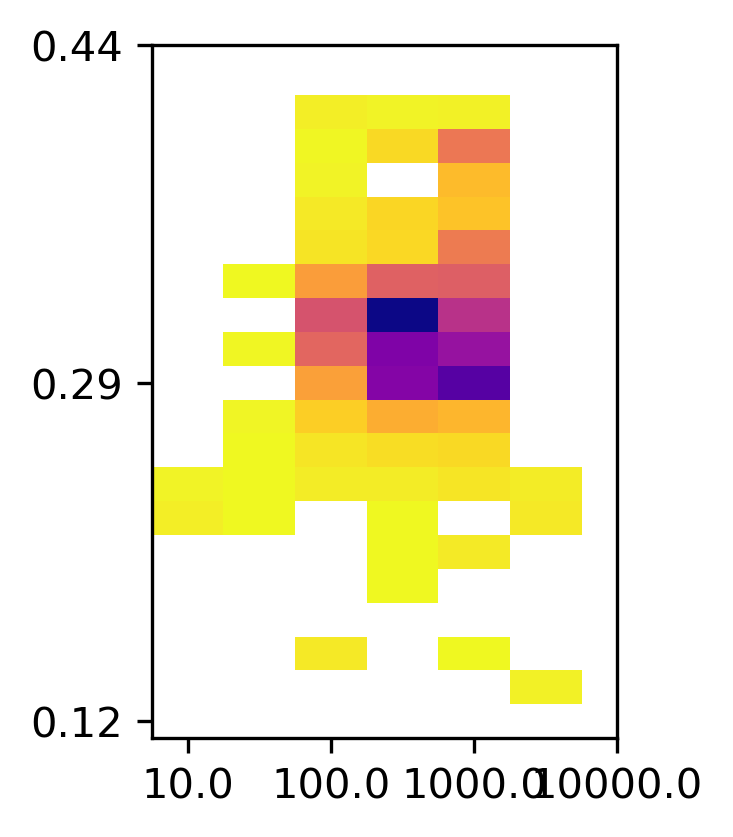

In [96]:
fig, ax = plt.subplots(figsize=(2,3),dpi=300)
im1 = ax.imshow(heatmap_arr, cmap='plasma_r', interpolation='none', aspect='auto',
            #    extent=[np.min(da_array), np.max(da_array), np.min(slope_array), np.max(slope_array)],
               origin='lower')
# ax.set_xticks([0, np.max(da_array)*.33, np.max(da_array)*.66, np.max(da_array)])
# ax.set_xticklabels([int(da_array[0]), int(round(da_array[int(pts*.33)],0)), int(round(da_array[int(pts*.67)],0)), int(da_array[pts-1])])
ax.set_yticks([0, 10, 20])
ax.set_xticks([0, 2, 4, 6])
ax.set_yticklabels(np.around([np.min(slope_array), slope_array[int(pts/2)], np.max(slope_array)], decimals=2))
ax.set_xticklabels([da_array[0], da_array[2], da_array[4], da_array[6]])
# ax.tick_params(axis='x',labelrotation=45)
# ax.xaxis.set_major_formatter(mtick.LogFormatterSciNotation())
plt.savefig(('./figure_outputs/t47.pdf'), bbox_inches="tight")

## Make curvature map with heads and transects

/scratch/ipykernel_87592/720647183.py:42: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticklabels(), va="center")


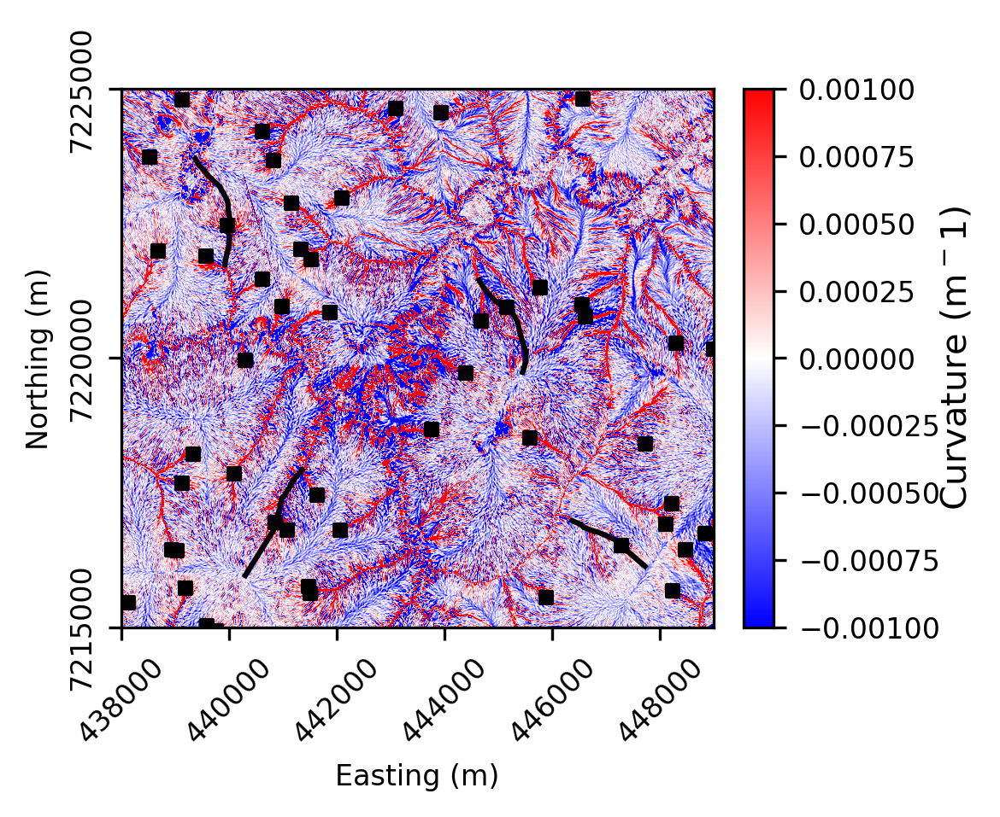

In [97]:
fig, ax = plt.subplots(figsize=(4,4), dpi=300)

with rasterio.open("./basic_stack_dir/seward_hsp__tan_curv_LW.tif", masked=True) as curvature: 
  curv_read = curvature.read(1)
  
  extent=[curvature.bounds[0], curvature.bounds[2], curvature.bounds[1], curvature.bounds[3]]

  curv_im0 = plt.imshow(curv_read, extent=extent, vmin=-0.001, vmax=0.001, cmap='bwr',  zorder=0) 

  curv_im = rasterio.plot.show(curvature, vmin=-0.001, vmax=0.001, cmap='bwr',
    extent=extent,
     ax=ax, zorder=1)   
  heads_plot = manual_heads.plot(
                          facecolor='k',
                          # extent=extent,
                          marker='s',
                          markersize=10,
                          # alpha=0.5,
                          ax=ax,
                          zorder=2,
                          )
  profiles_plot = profiles.plot(color='k',
                          # extent=extent,
                          # alpha=0.5,
                          ax=ax,
                          zorder=3,
                          )


divider = make_axes_locatable(ax)
# Add an axes to the right of the main axes.
cax = divider.append_axes("right", size="5%", pad="5%")
cb = fig.colorbar(curv_im0, cax=cax, orientation='vertical')
cb.set_label('Curvature (m$^-1$)', labelpad=0)
cb.ax.tick_params(labelsize=8)

### Start "Standard map format"

ax.set_ylabel("Northing (m)", fontsize=8)
ax.set_xlabel("Easting (m)", fontsize=8)
ax.yaxis.set_major_locator(ticker.LinearLocator(3))
ax.set_yticklabels(ax.get_yticklabels(), va="center")
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.0f'))
ax.tick_params(
  axis='x',
   rotation=45, 
   labelsize=8
  )
ax.tick_params(
  axis='y',
   rotation=90, 
   labelsize=8
  )

### End "Standard map format"

# fig.axes[1].tick_params(
#   axis='both',
#   #  rotation=90, 
#    labelsize=8
#   )

# fig.axes[1].set_xlabel(
#   'Curvature (m$^-1$)',
#   #  rotation=90, 
#    size=8
#   )

fig.tight_layout()

ax.set_ylim((7.215e6, 7.225e6))
ax.set_xlim((438000, 449000))

plt.savefig('./figure_outputs/curvature_map.pdf')

# Computationally intensive steps to run only once

## Sample raster stack at basin points (run once)

In [98]:
# I use the "split-apply-combine" workflow to split up the landscape into basins and then perform analyses based on basin averages,
# ranges, etc. hence why I am calling the basin raster the "splitter"

In [99]:
import glob

stack = [(os.path.basename(name)) for name in glob.glob((os.path.join(basic_stack_dir,'*.tif')))]

stack_names = [os.path.splitext(name)[0] for name in stack]

print(stack_names)

# Build a "stack" of rasters and get the name of the raster file to describe the dataset for column names in the 
# resulting dataframe. 

['1517_masked', '1517_all', 'seward2_hsp_elev', 'seward_hsp__dinf_area', 'slope_15m', 'aspect_15m', '1519_all', '1519_masked', 'aspect_40m', 'seward_hsp__tan_curv_LW', 'slope_40m']


In [100]:
splitter_raster = './lsdtt_exports/hcc_AllBasins.tif'
splitter_raster_var = "junct"

# LSDTopoTools exports a raster file in which delineated basins are given data values that correspond to the
# specific junction that defines their outlet, which are just some of the many junctions the algorithm
# generates, resulting in raster values like 217, 336, 387, etc. A file called "AllBasinsInfo.csv" lists the junction number
# and the basin ID number which follows more logically 1, 2, 3 etc. 

In [101]:
### Step 1: Get "splitter" raster as a set of coordinates
# Think about writing this to save memory
rds = rxr.open_rasterio(
    splitter_raster,
)
rds = rds.squeeze().drop("spatial_ref").drop("band")
rds.name = splitter_raster_var #the basin raster is written with the outlet_junction from the AllBasins.csv
df = rds.to_dataframe().reset_index()

#Eliminate data points where the basin raster did not have a basin
df=df[df[splitter_raster_var]>=0.0] 

#Convert them to integers 
df.junct = df[splitter_raster_var].astype(int)

coords = [(x,y) for x, y in zip(df.x, df.y)]

### Step 2: Sample the stack across the splitter raster while retaining the raster's splitter variable 
# sample data from rasters
if sample_stack == True:
    for i, raster_file in enumerate(stack):
        # Sample the raster at every point location and store values in DataFrame
        src = rasterio.open((os.path.join(basic_stack_dir, raster_file)))
        col = stack_names[i]
        print(col)
        df[col] = [x[0] for x in src.sample(coords)]
        src.close()

    df.to_csv('./splitter_raster_stack_sample_raw.csv')

## Clean some nodatas 

In [102]:
if sample_stack == True:
    # Clean where NoData values are

    curv_column = 'seward_hsp__tan_curv_LW'
    slope_column = 'slope_15m'
        
    df.loc[df[slope_column]< -100.0 ] = np.nan

    # The default for some of these seems to be -3
    df.loc[df[curv_column]<= -3.0 ] = np.nan
    df.loc[df['1519_all']<= -3.0 ] = np.nan

    ##  Add an outlet elevation by assuming minimum elevation in each basin is the outlet
    df['Outlet Elev'] = df.junct.map(df.groupby(['junct']).min()['seward2_hsp_elev'])

    # Save cleaned and augmented data
    df.to_csv('./splitter_raster_stack_sample.csv')
# else: 
#     df = pd.read_csv('./splitter_raster_stack_sample.csv')

## Normalize for LOS bias with pixelwise z-scores for aspect groups

Since InSAR displacements are dependent on line-of-sight (LOI), I'm going to calculate z-scores for displacement of pixels in 8 direction bins, which would be like cardinal directions but will center on the LOS of the satellite to be more precise then cardinal directions

## Bin all pixels into 8 direction bins based on LOS

look direction of satellite: from west (-103 degrees from N or 257)

In [103]:
# These angles are adjusted slightly to make "west" at 257 to more precisely align with LOS
if load_data == False:
    df['asp_card'] = pd.cut(df['aspect_15m'],
                            [0, 9.5, 54.5, 99.5, 144.5, 189.5, 234.5, 279.5, 324.5, 360],
                            labels=["N", "NE", "E", "SE","S", "SW", "W", "NW", "N"],
                            ordered=False
                        )

## Calculate pixelwise displacement z-score for each bin

In [104]:
if load_data == False:
    cardinal_order = ["N", "NE", "E", "SE","S", "SW", "W", "NW"]

    insar_columns=["1519_all", "1519_masked", "1517_all", "1517_masked"]



    # Edge effects of model made anomalously high displacements on edges of scene. No "real" values are more than 0.07 m

    df.loc[df['1519_all']>0.07]['1519_all'] = np.nan

    for column in insar_columns:
        zscore_string = column+"_zscore"
        df[zscore_string] = np.nan
        for cardinal in df['asp_card'].unique():
            numerator = df.loc[df['asp_card'] == cardinal][column] - df.loc[df['asp_card'] == cardinal][column].mean()
            denomenator = df.loc[df['asp_card'] == cardinal][column].std(ddof=0)
            zscores = numerator/denomenator
            zscore_string = column+"_zscore"
            df[zscore_string].loc[df['asp_card'] == cardinal] = zscores

    df.to_csv('./splitter_raster_stack_sample.csv')

## Polygonize basin raster for plotting (run once)

In [105]:
if polygonize_raster == True:
    # df = pd.read_csv('./splitter_raster_stack_sample.csv')
    
    from rasterio.features import shapes
    mask = None
    with rasterio.Env():
        with rasterio.open(splitter_raster) as src:
            image = src.read(1) # first band
            results = (
            {'properties': {splitter_raster_var: v}, 'geometry': s}
            for i, (s, v) 
            in enumerate(
                shapes(image, mask=mask, transform=src.transform)
            ))

            geoms = list(results)

            gpd_polygonized_raster  = gpd.GeoDataFrame.from_features(geoms, crs=src.crs) #Joanmarie added that last bit for crs

    #https://gis.stackexchange.com/questions/187877/how-to-polygonize-raster-to-shapely-polygons/187883

    gpd_polygonized_raster_orig = gpd_polygonized_raster[gpd_polygonized_raster[splitter_raster_var] >= 0.0]

    #df[splitter_raster_var] = df[splitter_raster_var].astype(int)
    # This is another instance when I was cleaning that somehow junctions became Nans....
    df_mean = df.groupby('junct').mean().reset_index()

    # Add attributes to shapefile
    gpd_polygonized_raster = gpd_polygonized_raster_orig.merge(df_mean, on='junct')

    #Add basin area column 
    gpd_polygonized_raster['Area'] = gpd_polygonized_raster['geometry'].area

    #Eliminate basins that are too small - not sure how these got in here...
    gpd_polygonized_raster.loc[gpd_polygonized_raster.Area < 100.0, 'Area'] = np.nan
    gpd_polygonized_raster['area_km2'] = gpd_polygonized_raster['Area']/1000000

    gpd_polygonized_raster=gpd_polygonized_raster.dropna()

    gpd_polygonized_raster.to_file('basins_with_attributes.shp')

    basins = gpd_polygonized_raster
    print(basins.columns)

else: 
    basins = gpd.read_file('basins_with_attributes.shp')
    basins.columns = (
        ['junct', 'Unnamed: 0', 'y', 'x', '1517_masked', '1517_all',
       'seward2_hsp_elev', 'seward_hsp__dinf_area', 'slope_15m', 'aspect_15m',
       '1519_all', '1519_masked', 'aspect_40m', 'seward_hsp__tan_curv_LW',
       'slope_40m', 'Outlet Elev', '1519_all_zscore',
       '1519_masked_zscore', '1517_all_zscore', '1517_masked_zscore', 'Area',
       'area_km2', 'geometry']
                     )

basins['area_km2'] = basins['Area']/1000000

# Load polygonized raster and stack data to plot and analyze

In [106]:
    basins.columns = (
        ['junct', 'Unnamed: 0', 'y', 'x', '1517_masked', '1517_all',
       'seward2_hsp_elev', 'seward_hsp__dinf_area', 'slope_15m', 'aspect_15m',
       '1519_all', '1519_masked', 'aspect_40m', 'seward_hsp__tan_curv_LW',
       'slope_40m', 'Outlet Elev', '1519_all_zscore',
       '1519_masked_zscore', '1517_all_zscore', '1517_masked_zscore', 'Area',
       'area_km2', 'geometry']
                     )

basins['area_km2'] = basins['Area']/1000000

basins.columns

Index(['junct', 'Unnamed: 0', 'y', 'x', '1517_masked', '1517_all',
       'seward2_hsp_elev', 'seward_hsp__dinf_area', 'slope_15m', 'aspect_15m',
       '1519_all', '1519_masked', 'aspect_40m', 'seward_hsp__tan_curv_LW',
       'slope_40m', 'Outlet Elev', '1519_all_zscore', '1519_masked_zscore',
       '1517_all_zscore', '1517_masked_zscore', 'Area', 'area_km2',
       'geometry'],
      dtype='object')

/scratch/ipykernel_87592/4040972842.py:26: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticklabels(), va="center")


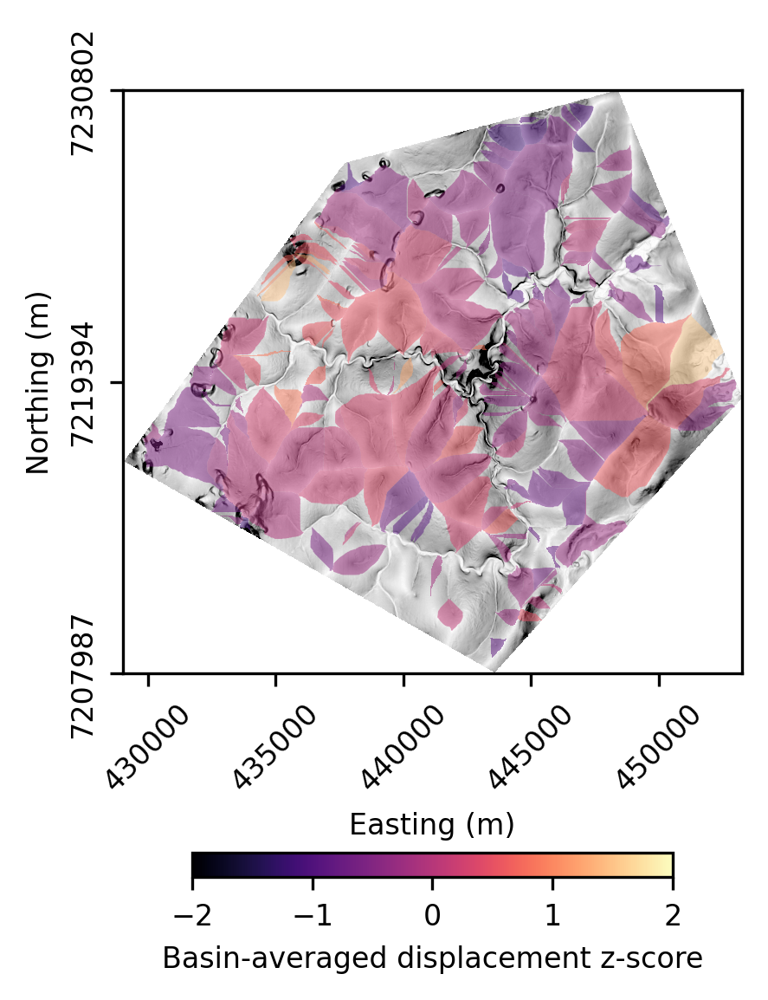

In [107]:
fig, ax = plt.subplots(figsize=(4,4),dpi=300)
with rasterio.open((os.path.join(basic_stack_dir,'slope_15m.tif')), masked=True) as slopeshade:
    slope = rasterio.plot.show(slopeshade, vmin=0.0, vmax=0.4, cmap='binary',  ax=ax, zorder=0)   
basin_plot = basins.plot(column='1517_masked_zscore',cmap='magma',
                                     vmax=2,
                                     vmin=-2,
                                     alpha=0.5,
                                     ax=ax,
                                     zorder=1,
                                     legend=True, 
                                     legend_kwds={
                                      # 'label': "Basin-averaged displacement z-score",
                        'orientation': "horizontal",
                        # 'labelsize': 8,
                        'pad':0.2,
                        'shrink':0.5,
                      
                        }
                        )

### Start "Standard map format"

ax.set_ylabel("Northing (m)", fontsize=8)
ax.set_xlabel("Easting (m)", fontsize=8)
ax.yaxis.set_major_locator(ticker.LinearLocator(3))
ax.set_yticklabels(ax.get_yticklabels(), va="center")
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.0f'))
ax.tick_params(
  axis='x',
   rotation=45, 
   labelsize=8
  )
ax.tick_params(
  axis='y',
   rotation=90, 
   labelsize=8
  )

### End "Standard map format"

fig.axes[1].tick_params(
  axis='both',
  #  rotation=90, 
   labelsize=8
  )

fig.axes[1].set_xlabel(
  'Basin-averaged displacement z-score',
  #  rotation=90, 
   size=8
  )

fig.tight_layout()

plt.savefig('./figure_outputs/basin_zscores.png')

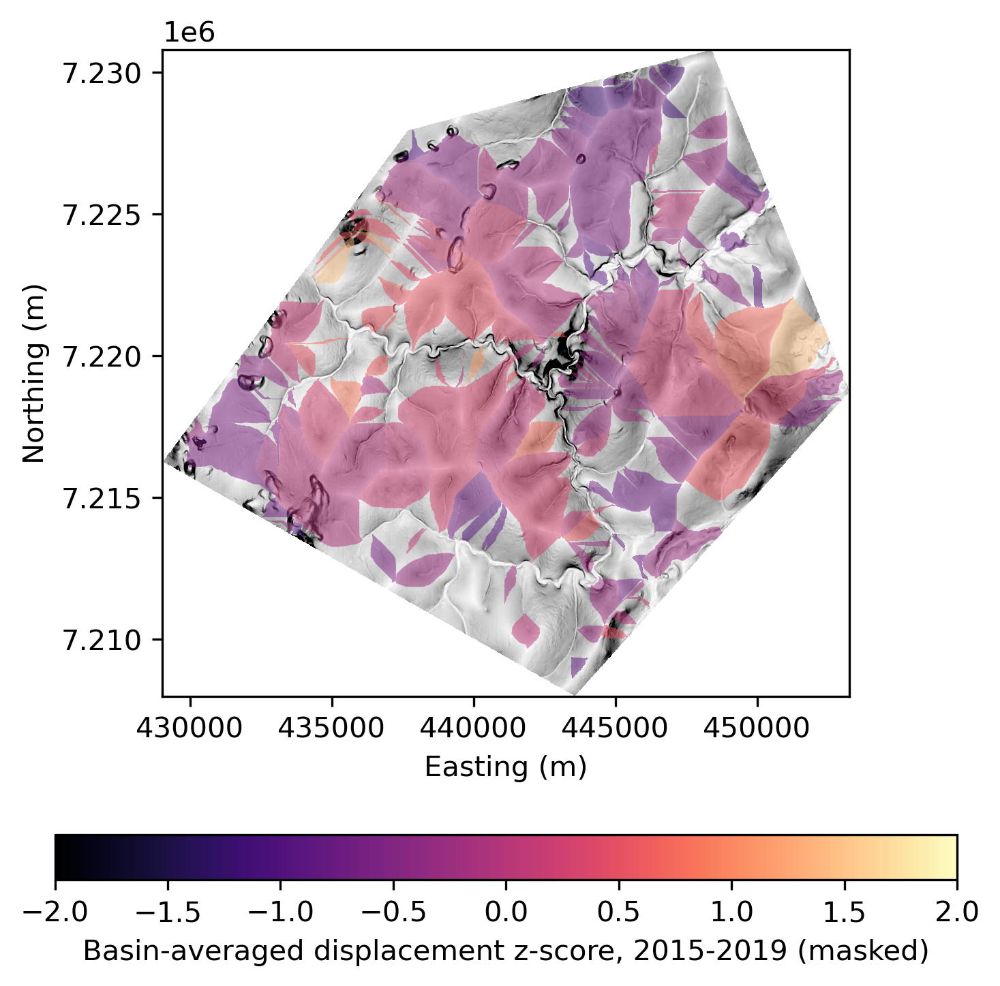

In [108]:
fig, ax = plt.subplots(figsize=(5,5),dpi=300)
with rasterio.open((os.path.join(basic_stack_dir,'slope_15m.tif')), masked=True) as slopeshade:
    slope = rasterio.plot.show(slopeshade, vmin=0.0, vmax=0.4, cmap='binary',  ax=ax, zorder=0)   
basin_plot = basins.plot(column='1517_all_zscore',cmap='magma',
                                     vmax=2,
                                     vmin=-2,
                                     alpha=0.5,
                                     ax=ax,
                                     zorder=1,
                                     legend=True, 
                                     legend_kwds={'label': "Basin-averaged displacement z-score, 2015-2019 (masked)",
                        'orientation': "horizontal"})
ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')

fig.tight_layout()

plt.savefig('./figure_outputs/1517_all_zscore.png')

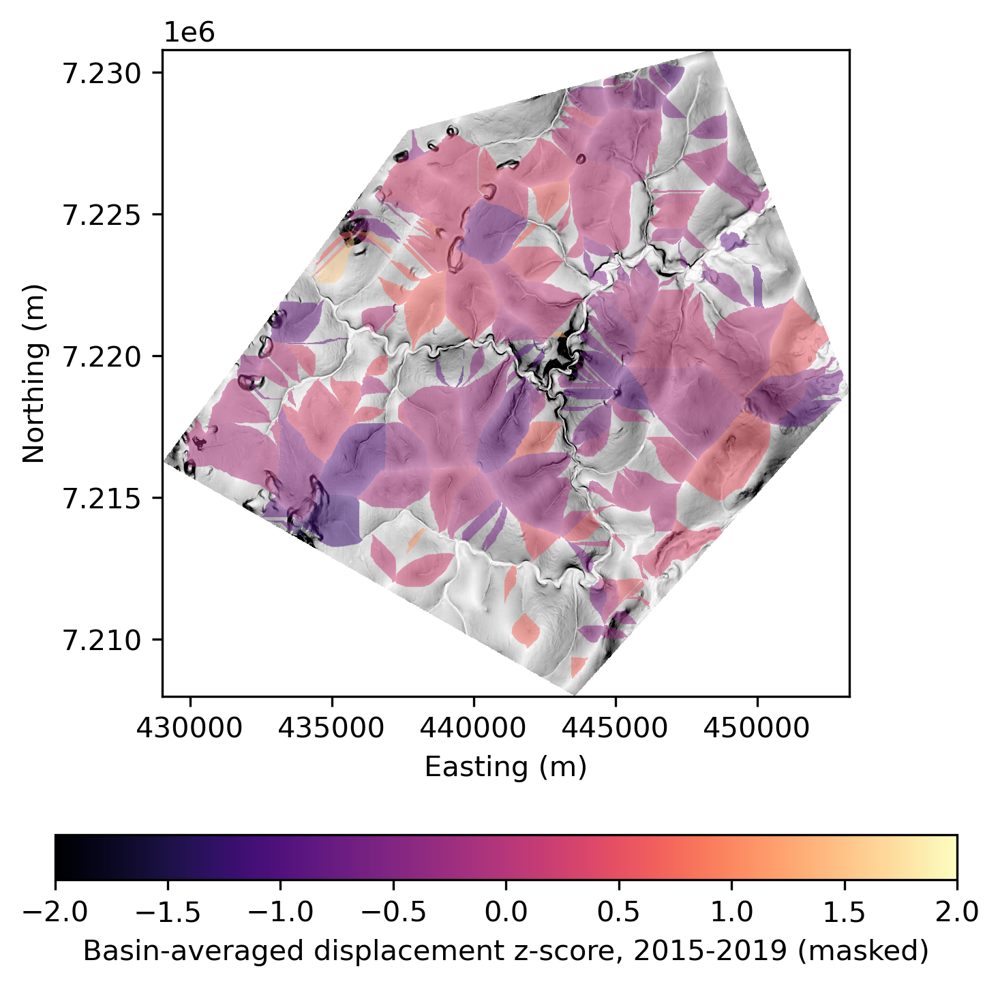

In [109]:
fig, ax = plt.subplots(figsize=(5,5),dpi=300)
with rasterio.open((os.path.join(basic_stack_dir,'slope_15m.tif')), masked=True) as slopeshade:
    slope = rasterio.plot.show(slopeshade, vmin=0.0, vmax=0.4, cmap='binary',  ax=ax, zorder=0)   
basin_plot = basins.plot(column='1519_masked_zscore',cmap='magma',
                                     vmax=2,
                                     vmin=-2,
                                     alpha=0.5,
                                     ax=ax,
                                     zorder=1,
                                     legend=True, 
                                     legend_kwds={'label': "Basin-averaged displacement z-score, 2015-2019 (masked)",
                        'orientation': "horizontal"})
ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')

fig.tight_layout()

plt.savefig('./figure_outputs/1519_masked_zscore.png')

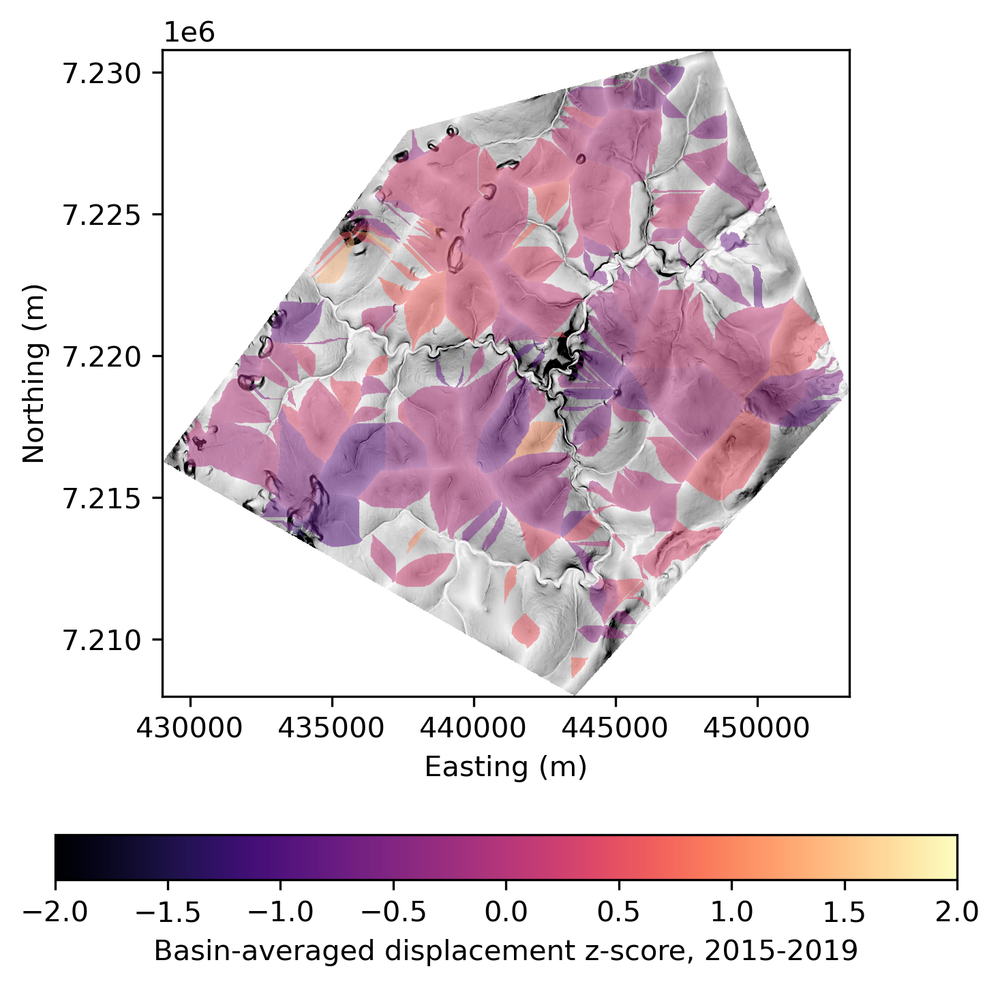

In [110]:
fig, ax = plt.subplots(figsize=(5,5),dpi=300)
with rasterio.open((os.path.join(basic_stack_dir,'slope_15m.tif')), masked=True) as slopeshade:
    slope = rasterio.plot.show(slopeshade, vmin=0.0, vmax=0.4, cmap='binary',  ax=ax, zorder=0)   
basin_plot = basins.plot(column='1519_all_zscore',cmap='magma',
                                     vmax=2,
                                     vmin=-2,
                                     alpha=0.5,
                                     ax=ax,
                                     zorder=1,
                                     legend=True, 
                                     legend_kwds={'label': "Basin-averaged displacement z-score, 2015-2019",
                        'orientation': "horizontal"})
ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')

fig.tight_layout()

plt.savefig('./figure_outputs/1519_all_zscore.png')

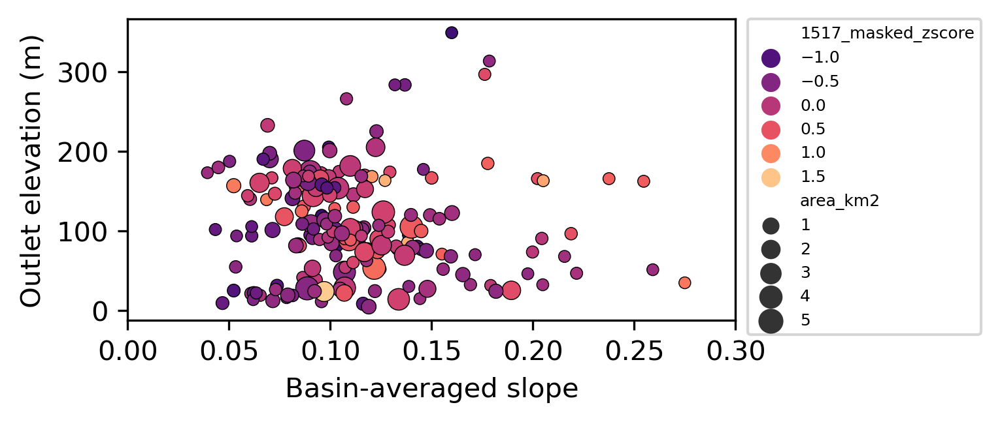

In [111]:
fig, ax = plt.subplots(figsize=(4,2),dpi=300)
# palette = sns.color_palette("magma", as_cmap=True)

scatter1 = sns.scatterplot(x='slope_15m', y='Outlet Elev',
                           hue='1517_masked_zscore',
                           size='area_km2',
                           data=basins,
                           edgecolor='black',
                           hue_norm=(-2,2),
                           # vmin=-2.0,
                           # vmax=2.0,
                           legend='brief', #'full'
                           palette="magma",
                           ax=ax)

plt.legend(title=None, fontsize='6', title_fontsize='14', 
           bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
ax.set_ylabel('Outlet elevation (m)')

ax.set_xlabel('Basin-averaged slope')
# ax.set_ylim(-1,3)
ax.set_xlim(0,0.3)

plt.savefig('./figure_outputs/slope_outlet_scatter.pdf',
#  bbox_inches="tight"
)

# Basin response to knickzone figures

In [112]:
lsdtt_dir = './lsdtt_exports/'

In [113]:
basins = gpd.read_file('basins_with_attributes.shp')

## Create geodataframe of river profile points from LSDTT chi analysis export

In [114]:
from shapely.geometry import Point

river_profiles = pd.read_csv(os.path.join(lsdtt_dir,"chi4_MChiSegmented.csv"))
geometry = [Point(xy) for xy in zip(river_profiles['longitude'], river_profiles['latitude'])]
river_profiles = gpd.GeoDataFrame(river_profiles, crs='epsg:4326', geometry=geometry)
#I was working in 3N

river_profiles = river_profiles.to_crs(basins.crs)

# Back-calculate channel slope....I think. Lol. 

river_profiles['channel_slope'] = river_profiles['m_chi'] * (river_profiles['drainage_area']**(-0.5))

## Connect river profiles to basin geodataframe

In [115]:
chi_basins = gpd.sjoin(river_profiles, basins, how = 'left')

chi_basins['junct'] = chi_basins['junct'].fillna(9999)

basin_averaged_chi = chi_basins.groupby(by='junct').mean().reset_index()

# This is the big one through the middle
main_drainage = chi_basins.loc[chi_basins['basin_key']==20]

/scratch/ipykernel_87592/2605015094.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  basin_averaged_chi = chi_basins.groupby(by='junct').mean().reset_index()


## Plot steep river reaches in map view

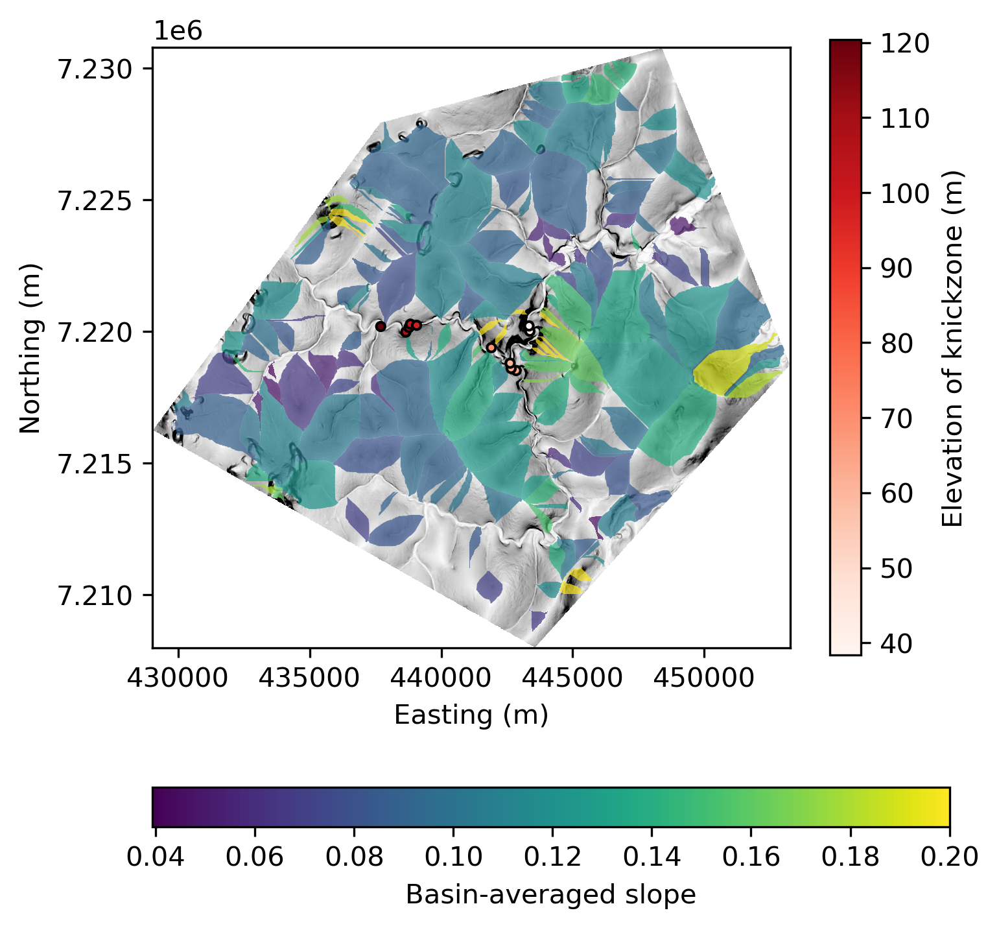

In [116]:
from rasterio.plot import show

slopeshade = rasterio.open((os.path.join(basic_stack_dir,'slope_15m.tif')), masked=True)

fig, ax = plt.subplots(figsize=(5,5), dpi=300)
slope = rasterio.plot.show(slopeshade, vmin=0.0, vmax=0.4, cmap='binary', ax=ax, zorder=0)                            
basin_plots = basins.plot(column='slope_15m', cmap='viridis', vmax=0.2, ax=ax, alpha=0.7, zorder=1, legend=True,
                                    legend_kwds={'label': "Basin-averaged slope",
                        'orientation': "horizontal"})
# network = main_drainage.loc[main_drainage['drainage_area']>4e7][::50].plot(column='channel_slope',
#                               cmap='gnuplot',
#                               norm=colors.LogNorm(),
#                               #vmax = 1E-3,
#                               edgecolor='none', markersize=2, ax=ax,zorder=2,
#                                             legend=True,
#                                             legend_kwds={'label': "Channel slope (m/m)",
#                                                          'orientation': "vertical"})
network2 = main_drainage[(main_drainage['drainage_area'] > 4E7)  & (main_drainage['channel_slope'] > 1e-2)][::100].plot(column='elevation',
                                                                                                                 cmap='Reds',
                                                                                                                 markersize=10,
                                                                                                                 edgecolor='k',
                                                                                                                 ax=ax,
                                                                                                                 zorder=3,
                                                                                                                 legend=True,
                                                                                                                    legend_kwds={'label': "Elevation of knickzone (m)",
                                                                                                                                 'orientation': "vertical"})

ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')

fig.tight_layout()

# plt.savefig('./figure_outputs/basin_slope_kz.png', bbox_inches="tight")

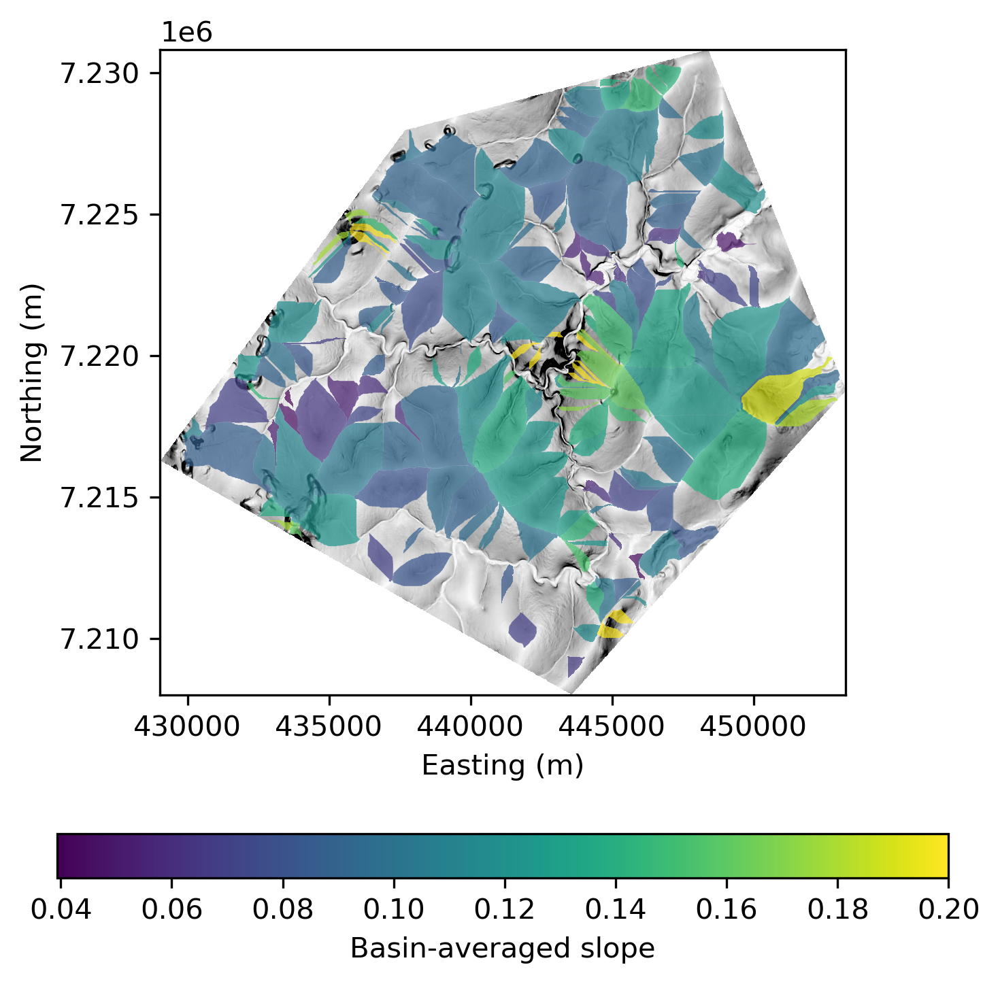

In [117]:
from rasterio.plot import show

slopeshade = rasterio.open((os.path.join(basic_stack_dir,'slope_15m.tif')), masked=True)

fig, ax = plt.subplots(figsize=(5,5), dpi=300)
slope = rasterio.plot.show(slopeshade, vmin=0.0, vmax=0.4, cmap='binary', ax=ax, zorder=0)                            
basin_plots = basins.plot(column='slope_15m', cmap='viridis', vmax=0.2, ax=ax, alpha=0.7, zorder=1, legend=True,
                                    legend_kwds={'label': "Basin-averaged slope",
                        'orientation': "horizontal"})
# network = main_drainage.loc[main_drainage['drainage_area']>4e7][::50].plot(column='channel_slope',
#                               cmap='gnuplot',
#                               norm=colors.LogNorm(),
#                               #vmax = 1E-3,
#                               edgecolor='none', markersize=2, ax=ax,zorder=2,
#                                             legend=True,
#                                             legend_kwds={'label': "Channel slope (m/m)",
#                                                          'orientation': "vertical"})
# network2 = main_drainage[(main_drainage['drainage_area'] > 4E7)  & (main_drainage['channel_slope'] > 1e-2)][::100].plot(column='elevation',
#                                                                                                                  cmap='Reds',
#                                                                                                                  markersize=10,
#                                                                                                                  edgecolor='k',
#                                                                                                                  ax=ax,
#                                                                                                                  zorder=3,
#                                                                                                                  legend=True,
#                                                                                                                     legend_kwds={'label': "Elevation of knickzone (m)",
#                                                                                                                                  'orientation': "vertical"})

ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')

fig.tight_layout()

# plt.savefig('./figure_outputs/basin_slope_no_kz.png', bbox_inches="tight")

Text(0.5, 0, 'Flow distance (m)')

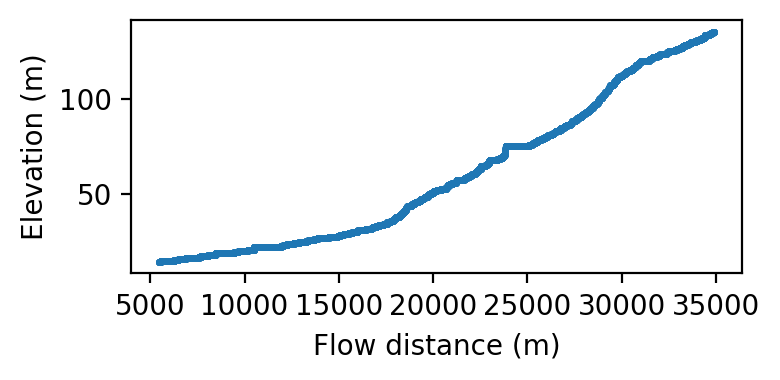

In [118]:
fig, ax = plt.subplots(figsize=(4,2), dpi=200, tight_layout=True)

# pal0 = palette = sns.color_palette("viridis", as_cmap=True)

main_drainage = chi_basins.loc[chi_basins['basin_key']==20]
rivers = sns.scatterplot(x=main_drainage.loc[main_drainage['drainage_area']>4.5e7]['flow_distance'],
               y=main_drainage.loc[main_drainage['drainage_area']>4.5e7]['elevation'], 
               #hue=main_drainage.loc[main_drainage['drainage_area']>4.5e7]['m_chi'],
                         edgecolor=None,
                         #palette=pal0,
                         s=5,
                         ax=ax,
                    
               )
ax.set_ylabel("Elevation (m)")
ax.set_xlabel("Flow distance (m)")
# plt.savefig('./figure_outputs/long_profile_main.png', bbox_inches="tight")

# Slope-area figures

## Make bins and get binned stats for rasters

In [119]:
# Load the sampled raster data
df = pd.read_csv('./splitter_raster_stack_sample.csv')

In [120]:
# Assign column names as variables

drainage_column = 'seward_hsp__dinf_area'
curv_column = 'seward_hsp__tan_curv_LW'
slope_column = 'slope_15m'


In [121]:
def make_slope_curv_disp(df, disp_column, plot_title):
    drainage_column = 'seward_hsp__dinf_area'
    curv_column = 'seward_hsp__tan_curv_LW'
    slope_column = 'slope_15m'
    
    # Make bins and get binned stats

    #Bins for area
    a1=10.**(np.arange(1, 7)) 
    a2 = np.arange(1,10,1)
    bin_edges=np.outer(a1, a2).flatten()

    med_stat_sa = binned_statistic(df[drainage_column],df[slope_column],
                                statistic='median',
                                bins=bin_edges)

    med_stat_ca = binned_statistic(df[drainage_column],df[curv_column],
                                statistic='median',
                                bins=bin_edges)

    mean_stat_dd = binned_statistic(df[drainage_column],df[disp_column],
                                statistic=np.nanmean, #####note
                                bins=bin_edges)

    fig, ax = plt.subplots(2,1, figsize=(5.5,4), dpi=300)

    # Plot all data as cloud

    scatter = ax[0].scatter(df[drainage_column][::100], df[slope_column][::100],
                        c='gray',alpha=0.1, edgecolor='none')
    scatter.set_sizes([1])

    # Now binned data

    im2 = ax[0].scatter(med_stat_sa.bin_edges[:-1],
                        med_stat_sa.statistic,
    #                   c='w',  
                        c=(mean_stat_dd.statistic*1000),
                        cmap='magma',
                        edgecolor='k',
                        zorder=1
                    )

    scatter2 = ax[1].scatter(df[drainage_column][::100], df[curv_column][::100],
                        c='gray',alpha=0.1, edgecolor='none')
    scatter2.set_sizes([1])
    im = ax[1].scatter(med_stat_ca.bin_edges[:-1],med_stat_ca.statistic,
    #                  c='w',    
                    c=(mean_stat_dd.statistic*1000),
                    cmap='magma',
                    edgecolor='k'
                    )

    #plt.axhline(0.0, color='k', linestyle='--', alpha=0.3)
    ax[0].set_xlim((1E1, 1E7))
    ax[0].set_ylim((0, 0.3))
    ax[0].set_xscale('log')
    ax[0].set_ylabel('Slope (m/m)')

    ax[1].set_xlim((1E1, 1E7))
    ax[1].set_ylim((-0.002, 0.005))
    ax[1].set_xlabel('Drainage area ($m^{{{2}}}$)')
    ax[1].set_ylabel('Curvature (LW)')
    ax[1].set_xscale('log')

    fig.tight_layout()

    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.83, 0.15, 0.02, 0.75])
    cb = fig.colorbar(im, cax=cbar_ax)
    cb.set_label('InSAR-derived displacement, mm/yr\n'+plot_title, rotation=270, labelpad=30)
    plt.savefig('./figure_outputs/slope_curve_area_colored_'+str(disp_column)+'.png', bbox_inches="tight")


In [122]:
# make_slope_curv_disp(df, '1517_masked', '15-17 masked')
# make_slope_curv_disp(df, '1517_all', '15-17 all')
# make_slope_curv_disp(df, '1519_masked', '15-19 masked')
# make_slope_curv_disp(df, '1519_all', '15-19 all')
# make_slope_curv_disp(df.loc[df['asp_card'] == 'E'], '1517_masked', '15-17 masked, east-facing')

## Slope-area and curvature-area plot

In [123]:
# fig, ax = plt.subplots(2,1, figsize=(5.5,4), gridspec_kw={'height_ratios':[2,1]}, dpi=400)

# # Plot all data as cloud

# scatter = ax[0].scatter(df[drainage_column][::500], df[slope_column][::500],
#                       c='gray',alpha=0.1, edgecolor='none')
# scatter.set_sizes([1])

# # Now binned data

# im2 = ax[0].scatter(med_stat_sa.bin_edges[:-1],
#                     med_stat_sa.statistic,
# #                   c='w',  
#                     c=(mean_stat_dd.statistic*1000),
#                     cmap='magma',
#                     edgecolor='k',
#                     zorder=1
#                    )

# scatter2 = ax[1].scatter(df[drainage_column][::500], df[curv_column][::500],
#                       c='gray',alpha=0.1, edgecolor='none')
# scatter2.set_sizes([1])
# im = ax[1].scatter(med_stat_ca.bin_edges[:-1],med_stat_ca.statistic,
# #                  c='w',    
#                    c=(mean_stat_dd.statistic*1000),
#                    cmap='magma',
#                    edgecolor='k'
#                   )

# #plt.axhline(0.0, color='k', linestyle='--', alpha=0.3)
# ax[0].set_xlim((1E1, 1E7))
# ax[0].set_ylim((0, 0.45))
# ax[0].set_xscale('log')
# ax[0].set_ylabel('Slope (m/m)')

# ax[1].set_xlim((1E1, 1E7))
# ax[1].set_ylim((-0.002, 0.005))
# ax[1].set_xlabel('Drainage area ($m^{{{2}}}$)')
# ax[1].set_ylabel('Curvature (LW)')
# ax[1].set_xscale('log')

# fig.tight_layout()

# fig.subplots_adjust(right=0.8)
# cbar_ax = fig.add_axes([0.83, 0.15, 0.02, 0.75])
# cb = fig.colorbar(im, cax=cbar_ax)
# cb.set_label('InSAR-derived displacement, mm/yr', rotation=270, labelpad=10)

# ax[0].scatter(
#     t47_failures['dInf_max'], t47_failures['slope_mean_rad'],
#     c='darkred',
#     s=5,
#     marker="X",
#     alpha=0.5, edgecolor='none')
# ax[0].scatter(
#     manual_heads_stats['dinf_max'], manual_heads_stats['slope_mean'],
#     c='k',
#     s=5,
#     marker='s',
#     alpha=0.9, edgecolor='none'
#     )
# plt.savefig('./figure_outputs/slope_curve_area_colored_data.png', bbox_inches="tight")
# # plt.savefig('./figure_outputs/slope_curve_area_colored.pdf', bbox_inches="tight")


## Do slope area plot for only east-facing pixels

## Show how slope angle modulates drainage area-displacement trends

In [124]:
steep = df.loc[df['slope_15m'].between(0.1775, 0.2025)]
steep["steep_cat"] = "0.18-0.20"

vsteep = df.loc[df['slope_15m'].between(0.2975, .6525)]
vsteep["steep_cat"] = "0.30-0.65"

nosteep = df.loc[df['slope_15m'].between(0.0975, 0.1025)]
nosteep["steep_cat"] = "0.10"

jointplot_df = pd.concat([nosteep, steep, vsteep])

# For ease of interpretation just use east-facing pixels

jointplot_df = jointplot_df.loc[jointplot_df['asp_card'] == "E"]

/scratch/ipykernel_87592/4027113215.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  steep["steep_cat"] = "0.18-0.20"
/scratch/ipykernel_87592/4027113215.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vsteep["steep_cat"] = "0.30-0.65"
/scratch/ipykernel_87592/4027113215.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

In [125]:
def make_slope_disp_steep_plot(data_column, plot_title):
    #Bins for area
    a1=10.**(np.arange(1, 7)) 
    a2 = np.arange(1,10,1)
    bin_edges=np.outer(a1, a2).flatten()

    mean_stat_dd1 = binned_statistic(nosteep[drainage_column],nosteep[data_column],
                                statistic=np.nanmean, #####note
                                bins=bin_edges)

    mean_stat_dd2 = binned_statistic(steep[drainage_column],steep[data_column],
                                statistic=np.nanmean, #####note
                                bins=bin_edges)

    mean_stat_dd3 = binned_statistic(vsteep[drainage_column],vsteep[data_column],
                                statistic=np.nanmean, #####note
                                bins=bin_edges)


    std_stat_dd1 = binned_statistic(nosteep[drainage_column],nosteep[data_column],
                                statistic=np.nanstd, 
                                bins=bin_edges)

    std_stat_dd2 = binned_statistic(steep[drainage_column],steep[data_column],
                                statistic=np.nanstd, 
                                bins=bin_edges)

    std_stat_dd3 = binned_statistic(vsteep[drainage_column],vsteep[data_column],
                                statistic=np.nanstd,
                                bins=bin_edges)
    

    g = sns.jointplot(x='seward_hsp__dinf_area', y=data_column, hue='steep_cat', data=jointplot_df[::100],
                  alpha=0, edgecolor='none', s=1,
                  palette="colorblind",
                  # kind='kde',

                 )
  

    # g = joint grid
    fig = g.figure
    # fig.set_size_inches((2.5, 2.5))
    fig.get_axes() # list of axes 

    ax = fig.get_axes()[0] #? 
    ax.set_xscale('log')
    ax.set_ylim((-0.02, 0.08)) 

    pal = sns.color_palette("colorblind")

    g.ax_marg_x.remove()

    im1 = ax.fill_between(mean_stat_dd1.bin_edges[:-1],
                        mean_stat_dd1.statistic-std_stat_dd1.statistic,
                        mean_stat_dd1.statistic+std_stat_dd1.statistic,
                        facecolor=pal.as_hex()[0],
                        alpha=0.25)

    im2 = ax.fill_between(mean_stat_dd2.bin_edges[:-1],
                        mean_stat_dd2.statistic-std_stat_dd2.statistic,
                        mean_stat_dd2.statistic+std_stat_dd2.statistic,
                        facecolor=pal.as_hex()[1],
                        alpha=0.25)

    im3 = ax.fill_between(mean_stat_dd3.bin_edges[:-1],
                        mean_stat_dd3.statistic-std_stat_dd3.statistic,
                        mean_stat_dd3.statistic+std_stat_dd3.statistic,
                        facecolor=pal.as_hex()[2],
                        alpha=0.25)

    im1 = ax.scatter(mean_stat_dd1.bin_edges[:-1],
                        mean_stat_dd1.statistic,
                    c=pal.as_hex()[0],  
                        # c=(med_stat_dd.statistic*1000),
                        edgecolor='k',
                        zorder=2
                    )

    im2 = ax.scatter(mean_stat_dd2.bin_edges[:-1],
                        mean_stat_dd2.statistic,
                    c=pal.as_hex()[1],  
                        # c=(med_stat_dd.statistic*1000),
                        edgecolor='k',
                        zorder=2
                    )

    im3 = ax.scatter(mean_stat_dd3.bin_edges[:-1],
                        mean_stat_dd3.statistic,
                    c=pal.as_hex()[2],  
                        # c=(med_stat_dd.statistic*1000),
                        edgecolor='k',
                        zorder=2
                    )

    plt.legend(title='Slope (m/m)')
    ax.set_xlim((0.5E1, 1E7))
    ax.set_ylim((-0.02, 0.06))
    ax.set_xlabel('Drainage area (m$^{{{2}}}$)')
    ax.set_ylabel('InSAR-derived displacement (mm/yr)\n'+plot_title)
    
    fig.tight_layout()
    plt.savefig('./figure_outputs/slope_trends_'+plot_title+'.pdf', dpi=300, bbox_inches="tight")
    # plt.savefig('./figure_outputs/slope_trends.pdf', bbox_inches="tight")

In [126]:
# make_slope_disp_steep_plot('1517_masked', '15-17 masked')
# make_slope_disp_steep_plot('1517_all', '15-17 all')
# make_slope_disp_steep_plot('1519_masked', '15-19 masked')
# make_slope_disp_steep_plot('1519_all', '15-19 all')

## Maybe there is cool N vs S

In [127]:
def make_slope_disp_asp_plot(data_column, plot_title):
  #Bins for area
  a1=10.**(np.arange(1, 7)) 
  a2 = np.arange(1,10,1)
  bin_edges=np.outer(a1, a2).flatten()
  
  north = df.loc[df['asp_card'] == 'N']
  south = df.loc[df['asp_card'] == 'S']


  mean_stat_ddn = binned_statistic(north[drainage_column],north[data_column],
                              statistic=np.nanmean, #####note
                              bins=bin_edges)

  mean_stat_dds = binned_statistic(south[drainage_column],south[data_column],
                              statistic=np.nanmean, #####note
                              bins=bin_edges)

  std_stat_ddn = binned_statistic(north[drainage_column],north[data_column],
                              statistic=np.nanstd, #####note
                              bins=bin_edges)

  std_stat_dds = binned_statistic(south[drainage_column],south[data_column],
                              statistic=np.nanstd, #####note
                              bins=bin_edges)

  aspect_df = pd.concat([north, south])

  pal = sns.color_palette("Paired")

  g = sns.jointplot(x='seward_hsp__dinf_area', y=data_column, hue='asp_card', data=aspect_df[::100],
                    alpha=0, edgecolor='none', s=1,
                    # palette="Paired",
                    palette = [pal.as_hex()[0], pal.as_hex()[4]],
                    legend=False,
                    # kind='kde',

                  )

  # g = joint grid
  fig = g.figure
  fig.get_axes() # list of axes 

  ax = fig.get_axes()[0] #? 
  ax.set_xscale('log')



  g.ax_marg_x.remove()

  im1 = ax.scatter(mean_stat_ddn.bin_edges[:-1],
                      mean_stat_ddn.statistic,
                    c=pal.as_hex()[0],  
                      # c=(med_stat_dd.statistic*1000),
                      edgecolor='k',
                  marker='o',
                      zorder=1,
                  label='North',
                    )

  im2 = ax.scatter(mean_stat_dds.bin_edges[:-1],
                      mean_stat_dds.statistic,
                    c=pal.as_hex()[4],  
                      # c=(med_stat_dd.statistic*1000),
                      edgecolor='k',
                  marker='s',
                      zorder=1,
                  label="South",
                    )

  im1 = ax.fill_between(mean_stat_ddn.bin_edges[:-1],
                        mean_stat_ddn.statistic-std_stat_ddn.statistic,
                        mean_stat_ddn.statistic+std_stat_ddn.statistic,
                      facecolor=pal.as_hex()[0],
                      alpha=0.25,
                      zorder=0)

  im2 = ax.fill_between(mean_stat_dds.bin_edges[:-1],
                        mean_stat_dds.statistic-std_stat_dds.statistic,
                        mean_stat_dds.statistic+std_stat_dds.statistic,
                      facecolor=pal.as_hex()[4],
                      alpha=0.25,
                      zorder=0)

  ax.legend(title='Aspect')

  # handles, labels = ax.get_legend_handles_labels()
  # ax.legend(handles=[handles[i] for i in [1,4]], labels=[labels[i] for i in [1,4]])

  ax.set_xlim((0.5E1, 1E7))
  ax.set_ylim((-0.02, 0.04))
  ax.set_xlabel('Drainage area (m$^{{{2}}}$)')
  ax.set_ylabel('InSAR-derived displacement (mm/yr)\n'+plot_title)

  fig.tight_layout()
  plt.savefig('./figure_outputs/aspect_trends_'+plot_title+'.pdf', bbox_inches="tight")
  # plt.savefig('./figure_outputs/aspect_trends.pdf', bbox_inches="tight")

In [128]:
# make_slope_disp_asp_plot('1517_masked', '15-17 masked')
# make_slope_disp_asp_plot('1519_masked', '15-19 masked')

## Show water track regime vs morphometry vs displacement in map view

In [129]:
from rasterio.mask import mask

disp = rasterio.open(os.path.join(basic_stack_dir, '1517_masked.tif'))

disp_read = disp.read(1, masked=True)

disp_high = np.ma.masked_where(disp_read < 0.01, np.ones_like(disp_read))


In [130]:
rgb = rasterio.open('June_RGB_NS.tif', masked=True)

/scratch/ipykernel_87592/2377806760.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticklabels(), va="center")


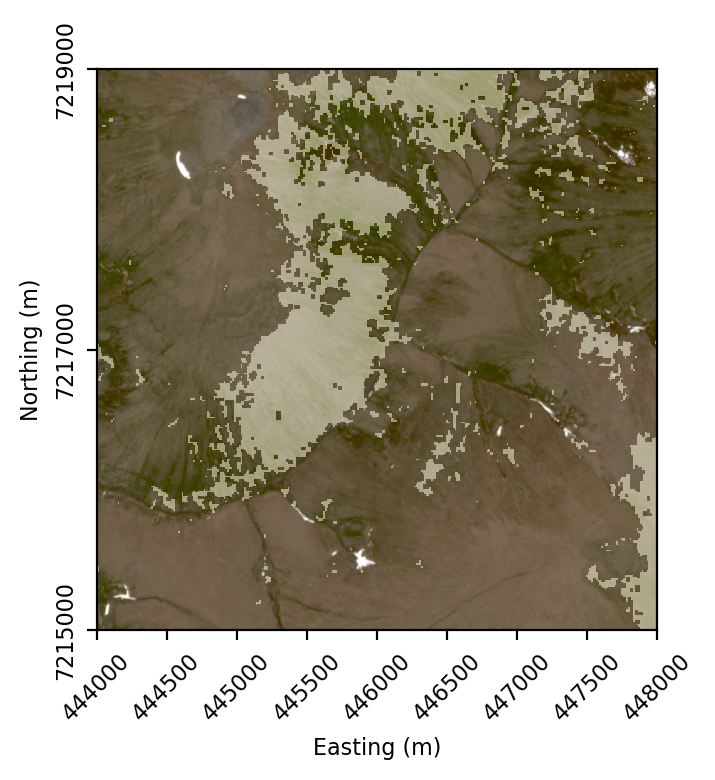

In [131]:
fig, ax = plt.subplots(figsize=(4.5, 4),dpi=200)

extent=[disp.bounds[0], disp.bounds[2], disp.bounds[1], disp.bounds[3]]

rbg_im = rasterio.plot.show(rgb,
                           ax=ax,
                          zorder=0)

insar0 = ax.imshow(disp_high,
 extent=extent,
  cmap='YlOrBr',
                   #vmax=0.1,
                   alpha=0.5, zorder=1) 



# cax = divider.append_axes("bottom", size="5%", pad="20%")
# cb = fig.colorbar(insar0, cax=cax, orientation='horizontal')
# cb.set_label('Displacement, m/yr', labelpad=0)



### Start "Standard map format"

ax.set_ylabel("Northing (m)", fontsize=8)
ax.set_xlabel("Easting (m)", fontsize=8)
ax.yaxis.set_major_locator(ticker.LinearLocator(3))
ax.set_yticklabels(ax.get_yticklabels(), va="center")
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.0f'))
ax.tick_params(
  axis='x',
   rotation=45, 
   labelsize=8
  )
ax.tick_params(
  axis='y',
   rotation=90, 
   labelsize=8
  )

### End "Standard map format"

ax.set_ylim((7.215e6, 7.219e6))
ax.set_xlim((444000, 448000))

fig.tight_layout()
plt.savefig('./figure_outputs/disp_rgb.pdf', bbox_inches="tight")

# Supplemental

## Morphological map

/scratch/ipykernel_87592/2685567010.py:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticklabels(), va="center")


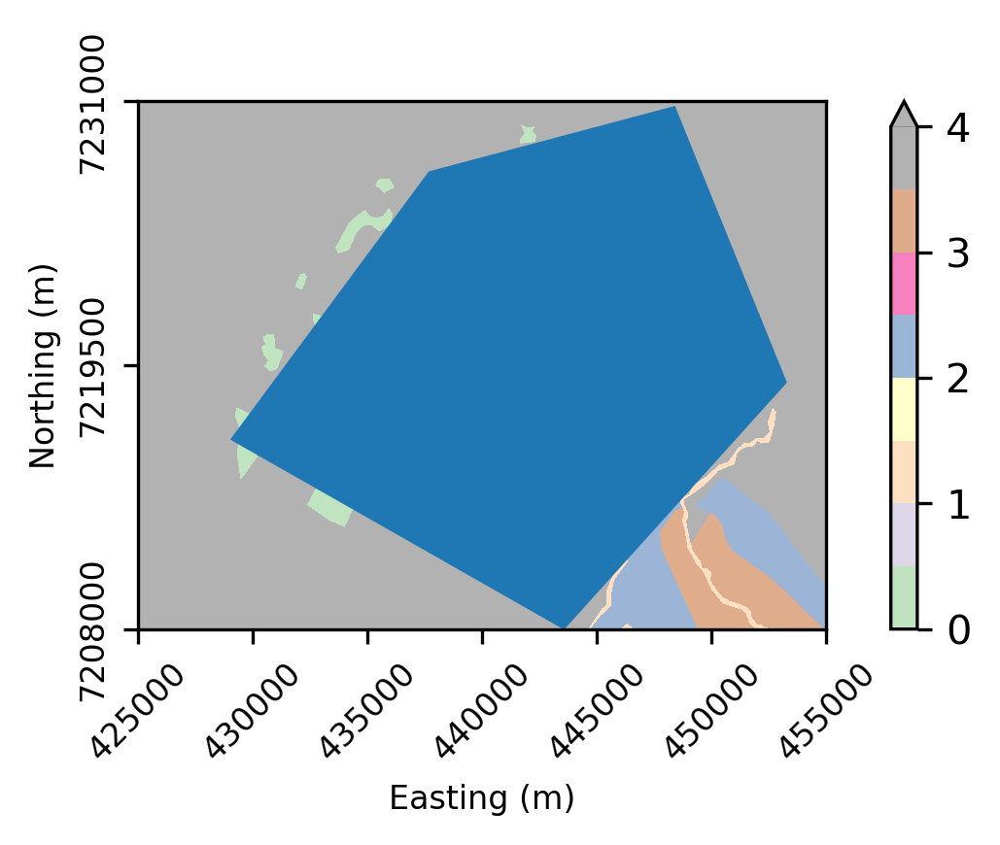

In [132]:
import rioxarray 
fig, ax = plt.subplots(figsize=(5,3),dpi=300)

# with rasterio.open((os.path.join(basic_stack_dir,'slope_15m.tif')), masked=True) as src_1:
#     with rasterio.vrt.WarpedVRT(src_1, crs="EPSG:32603") as vrt_1:
#         rds_1 = rioxarray.open_rasterio(vrt_1)
#         pl1 = rds_1.sel(band=1).plot.imshow(ax=ax,
#                                         vmin=0.0, vmax=0.4, cmap='binary',
#                                         )
#         ax.set_title("")       

with rasterio.open('morph_map.tif', masked=True) as src_2:
    with rasterio.vrt.WarpedVRT(src_2, crs="EPSG:32603") as vrt_2:
        rds_2 = rioxarray.open_rasterio(vrt_2)
        pl2 = rds_2.sel(band=1).plot.imshow(
                                    ax=ax, alpha=0.5,
                                    vmax=4,
                                    cmap="Accent",
                                    )
        ax.set_title("")     
area = gpd.read_file("expanded_insar_clipper.shp")

area.plot(facecolor=None, ax=ax)

### Start "Standard map format"

ax.set_ylabel("Northing (m)", fontsize=8)
ax.set_xlabel("Easting (m)", fontsize=8)
ax.yaxis.set_major_locator(ticker.LinearLocator(3))
ax.set_yticklabels(ax.get_yticklabels(), va="center")
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.0f'))
ax.tick_params(
  axis='x',
   rotation=45, 
   labelsize=8
  )
ax.tick_params(
  axis='y',
   rotation=90, 
   labelsize=8
  )

### End "Standard map format"
ax.set_ylim((7.208e6, 7.231e6))
ax.set_xlim((425000, 455000))     

fig.tight_layout()
plt.savefig('./figure_outputs/morph_map.pdf', bbox_inches="tight")

              

In [133]:
df.columns

Index(['Unnamed: 0.3', 'Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0', 'y', 'x',
       'junct', '1517_masked', '1517_all', 'seward2_hsp_elev',
       'seward_hsp__dinf_area', 'slope_15m', 'aspect_15m', '1519_all',
       '1519_masked', 'aspect_40m', 'seward_hsp__tan_curv_LW', 'slope_40m',
       'Outlet Elev', 'asp_card', '1519_all_zscore', '1519_masked_zscore',
       '1517_all_zscore', '1517_masked_zscore'],
      dtype='object')

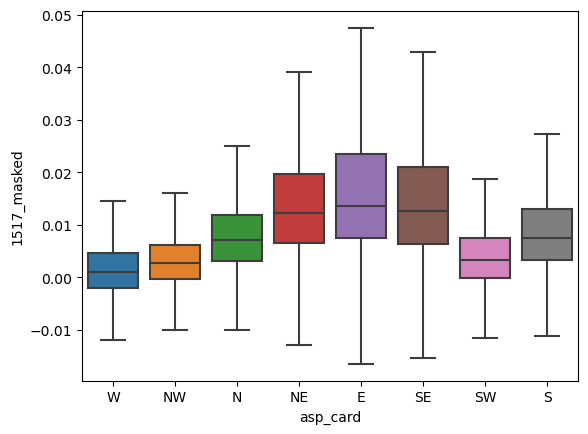

In [134]:
fig, ax = plt.subplots()
im  = sns.boxplot(data=df, x='asp_card', y='1517_masked', showfliers = False, ax=ax)
plt.savefig("./figure_outputs/boxplot.pdf")

## extras

In [135]:

# fig, ax=plt.subplots(figsize=(4,4), dpi=300)
# bin_2 = np.rad2deg(df[slope_column])

# #Bins for area
# a1=10.**(np.arange(0, 7)) 
# a2 = np.arange(1,10,1)
# da_array=np.outer(a1, a2).flatten()

# bin_2_array = np.arange(bin_2.min(), bin_2.max(), 1.0)

# #Cut the dataframe by bins 
# df['bin_dinf'] = pd.cut(df[drainage_column],bins=da_array,
#                         labels=range(len(da_array)-1)
#                         #labels=da_array[:-1]
#                              )
# df['bin_slope'] = pd.cut(bin_2,bins=bin_2_array, 
#                          labels=range(len(bin_2_array)-1)
#                          #labels=bin_2_array[:-1]
#                               )

# df_out = df.groupby(['bin_slope','bin_dinf'])['1517_masked']

# #Make the array by reshaping the output df
# arr = df_out.mean().sort_index().values.reshape(len(bin_2_array)-1,len(da_array)-1) * 100 #to cm
# #Y axis is rows in reshape (first value in reshape)

# # Count occurrences in each bin in heatmap
# counts = df_out.count().sort_index().values.reshape(len(bin_2_array)-1,len(da_array)-1)

# # Make plots
# import matplotlib.ticker as mtick

# im = ax.imshow(arr, cmap='magma', interpolation='none', aspect='auto',
# #                           extent=[0, np.max(da_array), np.min(bin_2_array), np.max(bin_2_array)],
#             extent=[0, len(da_array)-1, np.min(bin_2_array), np.max(bin_2_array)],
# #               extent=[0, len(da_array)-1, 0, len(bin_2_array)-1],
#                vmin=0.0,
#                vmax=2.5,
#                origin='lower')

# divider = make_axes_locatable(ax)
# # Add an axes to the right of the main axes.
# cax = divider.append_axes("top", size="5%", pad="15%")
# cb = fig.colorbar(im, cax=cax, orientation='horizontal')
# cb.set_label('InSAR displacement, cm/yr', labelpad=-45)

# ax.set_ylim(0.0, 60)

# ax.set_ylabel('Slope (degrees)')
# #         ax[y,x].set_xscale('log')
# #         ax[y,x].set_xticks([10**x for x in np.arange(0., 7., 1.)])

# #         print(ax[y,x].get_xticklabels())

# ax.set_xticklabels(["$10^{{{:.0f}}}$".format(x) for x in range(7)])

# # if len(ax.get_xticklabels()) == (len(da_array)+1):
# #     ax.set_xticklabels(["$10^{{{:.0f}}}$".format(x) for x in range(7)])
# # elif len(ax.get_xticklabels()) == ((len(da_array))+1)/2:
# #     ax.set_xticklabels(["$10^{{{:.0f}}}$".format(x) for x in range(7)][::2])
# # elif len(ax.get_xticklabels()) == ((len(da_array))+1)/3:
# #     ax.set_xticklabels(["$10^{{{:.0f}}}$".format(x) for x in range(7)][::3])


# #         ax[y,x].xaxis.set_major_formatter(mtick.LogFormatterSciNotation())

# import matplotlib

# matplotlib.rcParams.update({"pdf.fonttype":42})
# plt.savefig("./figure_outputs/heatmap1.pdf")

## Old figures

In [136]:
# curv = rasterio.open(os.path.join(basic_stack_dir, 'seward_hsp__tan_curv_LW.tif'))
# curv_read = curv.read(1, masked=True)

# extent=[curv.bounds[0], curv.bounds[2], curv.bounds[1], curv.bounds[3]]

# slopeshade = rasterio.open((os.path.join(basic_stack_dir,'slope_15m.tif')), masked=True)

# dinf = rasterio.open(os.path.join(basic_stack_dir, 'seward_hsp__dinf_area.tif'))
# dinf_read=dinf.read(1, masked=True)

# max_curve=0.001

# curv_lo = np.ma.masked_where(curv_read < -0.001, curv_read)
# curv_mask = np.ma.masked_where(curv_lo > max_curve, curv_lo)

# max_dinf=1e4

# dinf_lo = np.ma.masked_where(dinf_read < 5E2, dinf_read)
# dinf_mask = np.ma.masked_where(dinf_lo > max_dinf, dinf_lo)

# curv_dinf_masked = np.ma.masked_where((dinf_read > 1E4) & (dinf_read < 1e3), curv_mask)

# # Did this so the lowest Blues wouldn't be white
# import matplotlib.colors as colors

# def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
#     new_cmap = colors.LinearSegmentedColormap.from_list(
#         'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
#         cmap(np.linspace(minval, maxval, n)))
#     return new_cmap

# cmap = plt.get_cmap('Blues')
# new_Blues = truncate_colormap(cmap, 0.3, 1.0)

# #https://stackoverflow.com/questions/18926031/how-to-extract-a-subset-of-a-colormap-as-a-new-colormap-in-matplotlib

# fig, ax = plt.subplots(figsize=(5, 4.5),dpi=200)

# insar0 = ax.imshow(disp_read, cmap='magma', vmax=0.1, zorder=0) 
# insar = rasterio.plot.show(disp, cmap='magma', vmin=-0.1, vmax=0.1, ax=ax, zorder=1) 
# im1 = ax.imshow(dinf_mask, extent=extent, norm=colors.LogNorm(), cmap=new_Blues, alpha=0.6, zorder=2)

# divider = make_axes_locatable(ax)
# # Add an axes to the right of the main axes.
# cax = divider.append_axes("bottom", size="5%", pad="20%")
# cb = fig.colorbar(insar0, cax=cax, orientation='horizontal')
# cb.set_label('Displacement, m/yr', labelpad=0)

# cax2 = divider.append_axes("right", size="5%", pad="5%")
# cb2 = fig.colorbar(im1, cax=cax2, orientation='vertical')
# # cb2.set_label('Drainage area (m$^{{{2}}}$)', labelpad=0)


# ax.set_xlabel('Easting (m)')
# ax.set_ylabel('Northing (m)')

# fig.tight_layout()
# # ax.set_ylim((7.2135e6, 7.2175e6))
# # ax.set_xlim((440000, 445000))
# # plt.savefig('./figure_outputs/disp_dinf.png', bbox_inches="tight")

## individual basin slope areas and max displacement

In [137]:
# has_junct = df.loc[df['junct'].notna()]
# has_junct['junct'] = has_junct['junct'].astype(int)

In [138]:
# #Bins for area
# a1=10.**(np.arange(1, 7)) 
# a2 = np.arange(1,10,1)
# bin_edges=np.outer(a1, a2).flatten()

# drainage_column = 'seward_hsp__dinf_area'
# slope_column = 'slope_15m'

# for i, junct in enumerate(has_junct.junct.unique()):
#     print(str(junct))
    
#     df_junct = has_junct.loc[has_junct['junct'] == junct]
    
#     mean_stat_sa = binned_statistic(df_junct[drainage_column],df_junct[slope_column],
#                             statistic='median',
#                             bins=bin_edges)

#     mean_stat_ca = binned_statistic(df_junct[drainage_column],df_junct[curv_column],
#                                 statistic='median',
#                                 bins=bin_edges)

#     mean_stat_dd = binned_statistic(df_junct[drainage_column],df_junct['insar_displacement'],
#                                 statistic='median',
#                                 bins=bin_edges)
#     fig, ax = plt.subplots(2,1, figsize=(6,4), dpi=200)

#     scatter = ax[0].scatter(df_junct[drainage_column], df_junct[slope_column],
#                           c='gray',alpha=0.1, edgecolor='none')
#     scatter.set_sizes([1])
#     im2 = ax[0].scatter(mean_stat_sa.bin_edges[:-1],
#                         mean_stat_sa.statistic,
#     #                   c='w',  
#                         c=(mean_stat_dd.statistic*1000),
#                         cmap='magma',
#                         edgecolor='k',
#                         zorder=1
#                        )

#     scatter2 = ax[1].scatter(df[drainage_column][::10], df[curv_column][::10],
#                           c='gray',alpha=0.1, edgecolor='none')
#     scatter2.set_sizes([1])
#     im = ax[1].scatter(mean_stat_ca.bin_edges[:-1],mean_stat_ca.statistic,
#     #                  c='w',    
#                        c=(mean_stat_dd.statistic*1000),
#                        cmap='magma',
#                        edgecolor='k'
#                       )

#     #plt.axhline(0.0, color='k', linestyle='--', alpha=0.3)
#     ax[0].set_xlim((1E1, 1E7))
#     ax[0].set_ylim((0, 0.25))
#     ax[0].set_xscale('log')
#     ax[0].set_ylabel('Slope (m/m)')

#     ax[1].set_xlim((1E1, 1E7))
#     ax[1].set_ylim((-0.01, 0.01))
#     ax[1].set_xlabel('Drainage area ($m^{{{2}}}$)')
#     ax[1].set_ylabel('Curvature (LW)')
#     ax[1].set_xscale('log')

#     fig.tight_layout()

#     fig.subplots_adjust(right=0.8)
#     cbar_ax = fig.add_axes([0.83, 0.15, 0.02, 0.75])
#     cb = fig.colorbar(im, cax=cbar_ax)
#     cb.set_label('InSAR-derived displacement, mm/yr', rotation=270, labelpad=10)
#     plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/junction_slopeareas', str(junct)+ '.png')))
#     plt.cla()
#     plt.close(fig)

after sorting them into folders by eye...

In [139]:
from pathlib import Path
main_dir = Path('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/junction_slopeareas')
png_paths = main_dir.glob('**/*.png')

zone_dict = {}

for path in png_paths:
    junct_no = int(path.stem)
    zone = path.parent.name
    zone_dict[junct_no] = zone

In [140]:
basins['junct'] = basins['junct'].astype(int)
basins['max_disp_zone'] = basins['junct'].map(zone_dict)


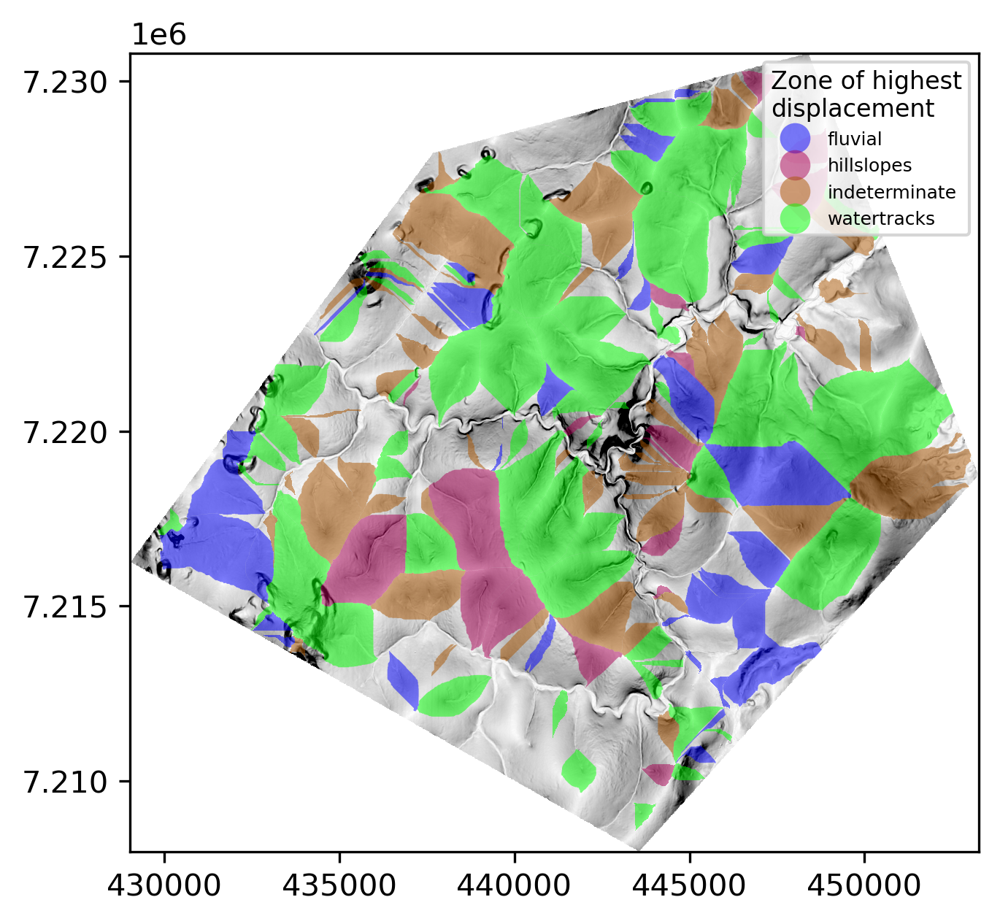

In [141]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig, ax = plt.subplots(figsize=(5,5),dpi=300)
slope = rasterio.plot.show(slopeshade, vmin=0.0, vmax=0.4, cmap='binary',  ax=ax, zorder=0)   
  
basins_im = basins.plot(column='max_disp_zone',cmap='brg', alpha=0.5, ax=ax, zorder=1,
                                     legend=True, 
                                      legend_kwds={'title': "Zone of highest\ndisplacement",
                                                   'fontsize':6,
                                                   'title_fontsize':8,
                                                   
#                        'orientation': "horizontal"
                                     }
                                    )


In [147]:
basins.columns = (
        ['junct', 'Unnamed: 0', 'y', 'x', '1517_masked', '1517_all',
       'seward2_hsp_elev', 'seward_hsp__dinf_area', 'slope_15m', 'aspect_15m',
       '1519_all', '1519_masked', 'aspect_40m', 'seward_hsp__tan_curv_LW',
       'slope_40m', 'Outlet Elev', '1519_all_zscore',
       '1519_masked_zscore', '1517_all_zscore', '1517_masked_zscore', 'Area',
       'area_km2', 'geometry', 'max_disp_zone']
                     )

In [148]:
basins.drop(columns="geometry").to_csv("basin_means.csv")

See the other script that has the statannotator package where you need a new conda environment where seaborn is 0.11.1